In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python`1
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

NameError: name 'os' is not defined

In [7]:

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = (10, 8)
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import RidgeCV, LassoCV, Ridge, Lasso
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import collections
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [8]:
train_df=pd.read_csv('../input/house-prices-advanced-regression-techniques/train.csv')
test_df=pd.read_csv('../input/house-prices-advanced-regression-techniques/test.csv')

Analyze data, feature distribution, skewness and outliers, percent of missing values...

In [9]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [10]:
train_df.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [11]:
print('Train', train_df.shape)
print('Test', test_df.shape)

Train (1460, 81)
Test (1459, 80)


In [12]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [13]:
test_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal


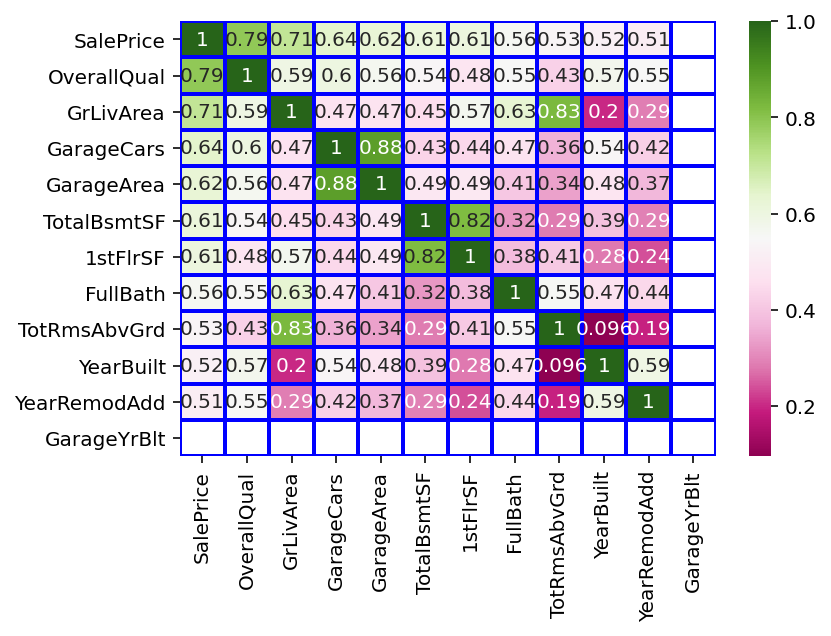

In [14]:
# correlation table
corr_train = train_df.corr()

# select top 12 highly correlated variables with SalePrice
num = 12
col = corr_train.nlargest(num, 'SalePrice')['SalePrice'].index
coeff = np.corrcoef(train_df[col].values.T)

# heatmap
heatmp = sns.heatmap(coeff, annot = True, xticklabels = col.values, yticklabels = col.values, linewidth=2,cmap='PiYG', linecolor='blue')

/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


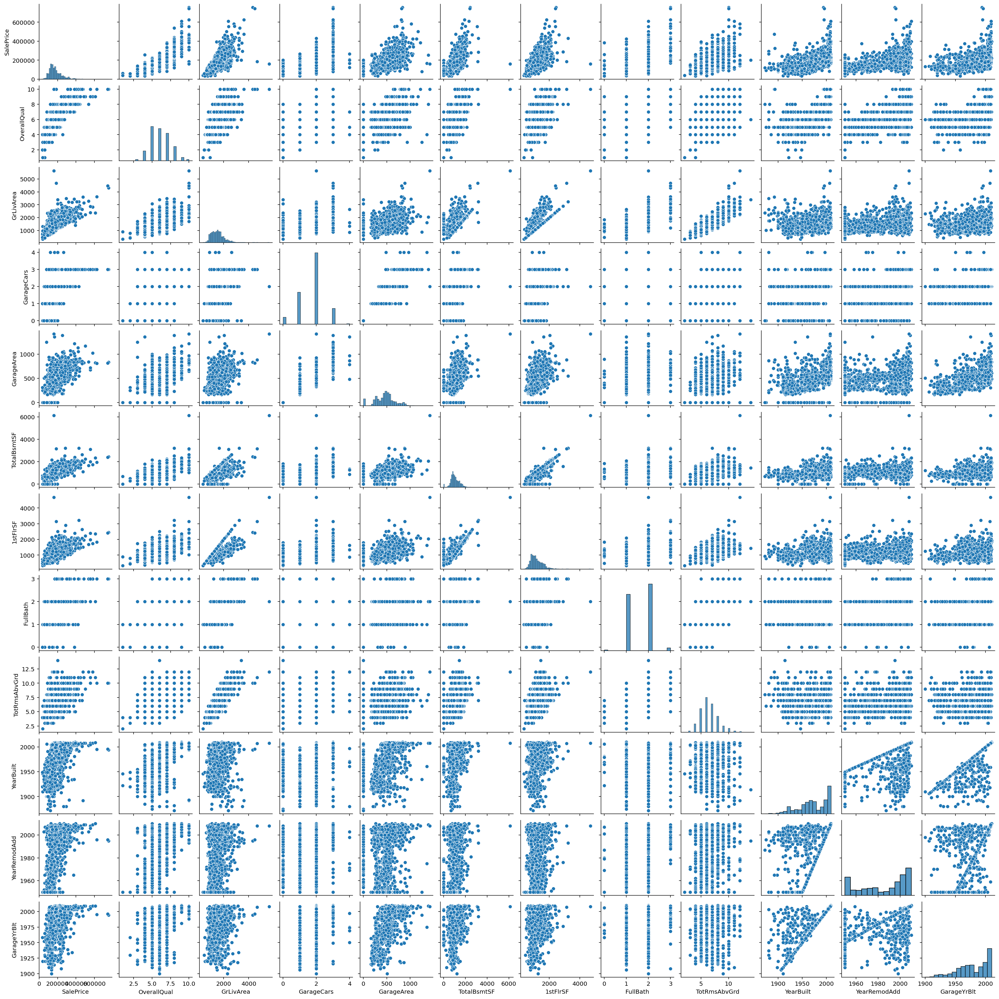

In [15]:
# Visualized the relationship between the target variable and top 12 features highly correlated with the target variable.

sns.pairplot(train_df[col], size=2);

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


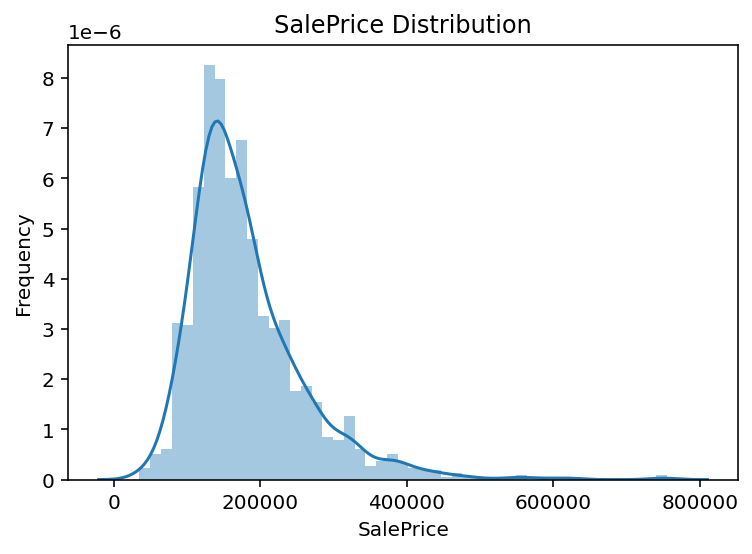

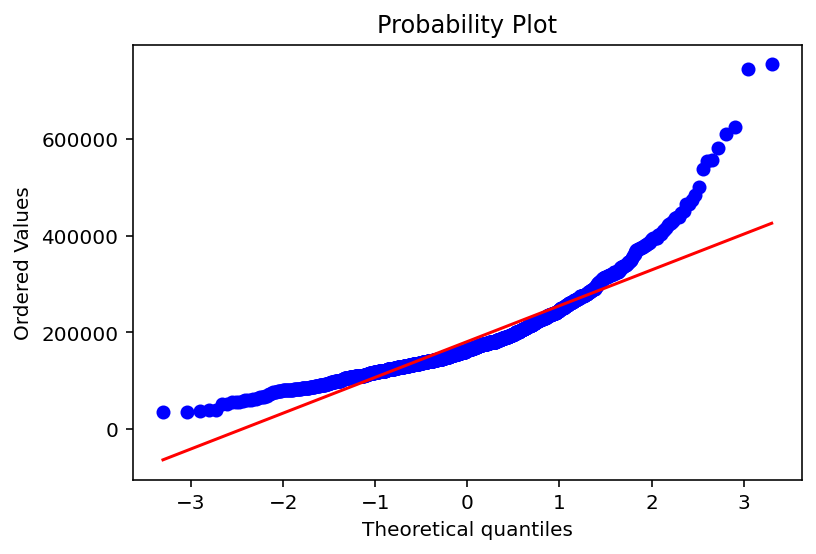

Skewness: 1.883
Kurtosis: 6.536


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


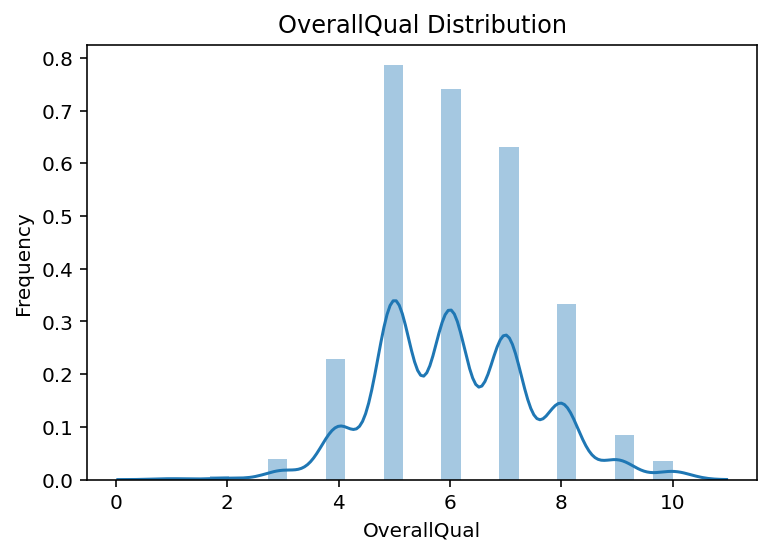

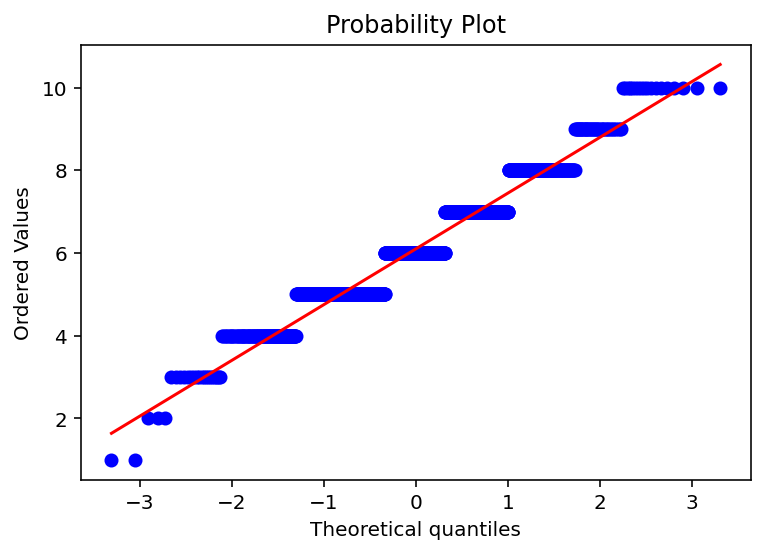

Skewness: 0.217
Kurtosis: 0.096


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


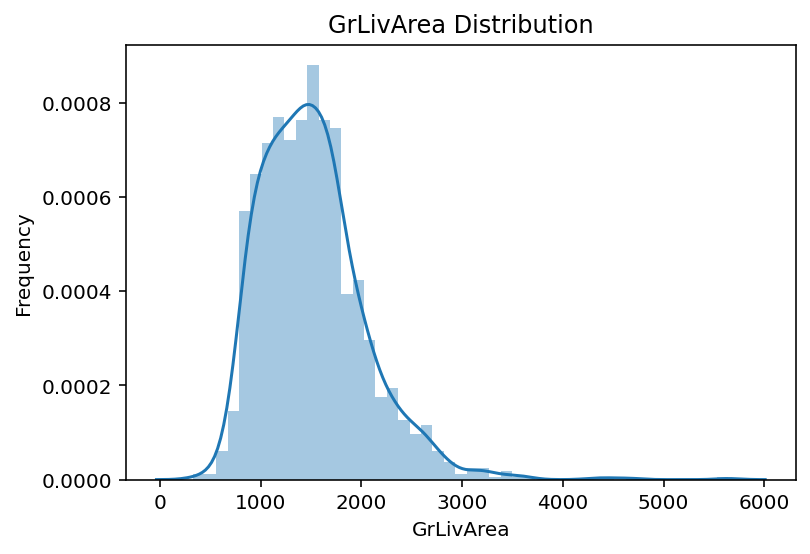

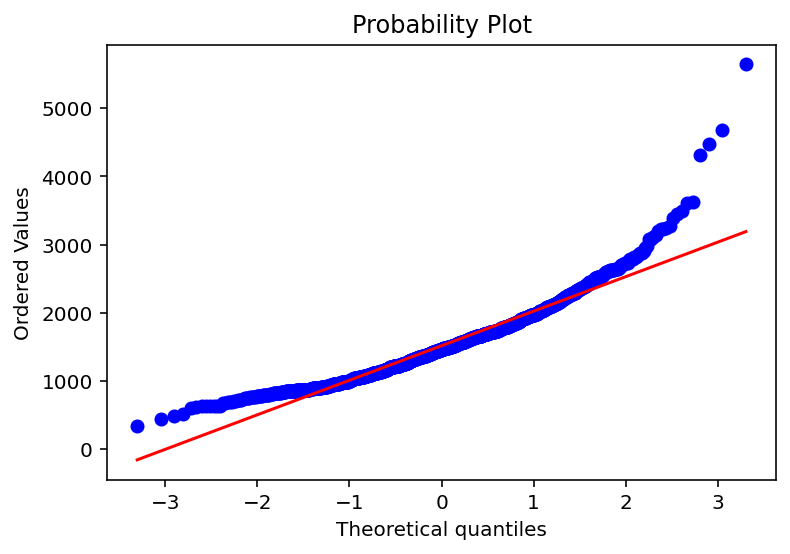

Skewness: 1.367
Kurtosis: 4.895


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


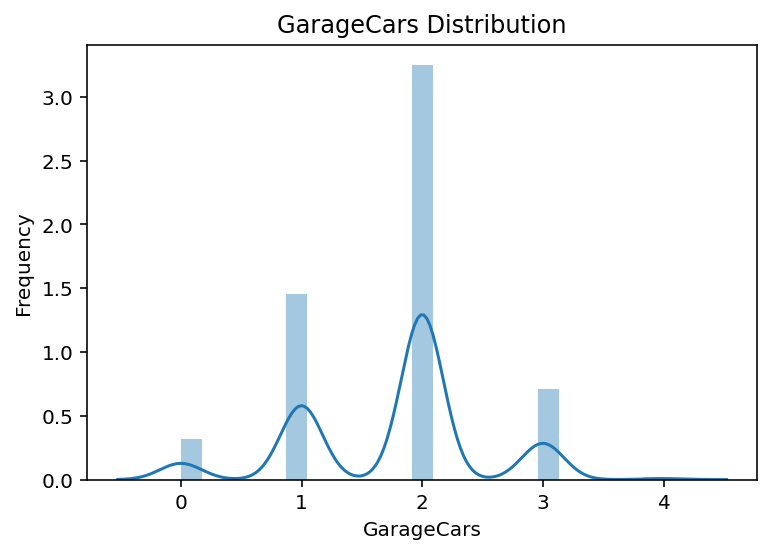

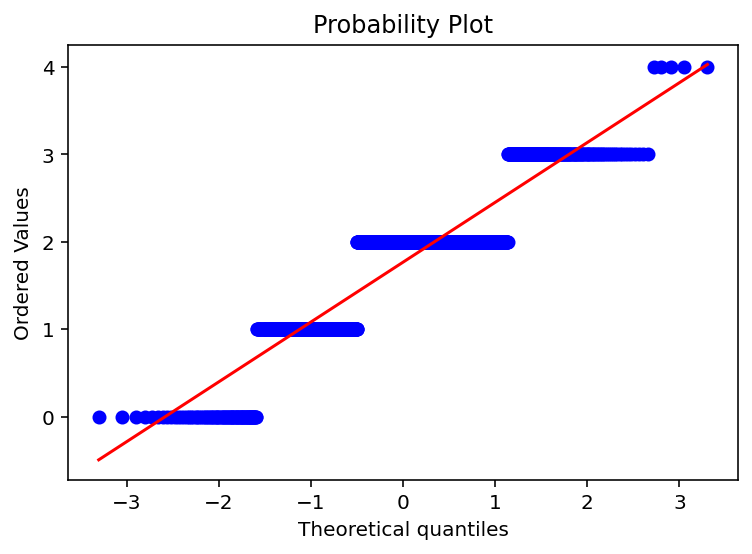

Skewness: -0.343
Kurtosis: 0.221


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


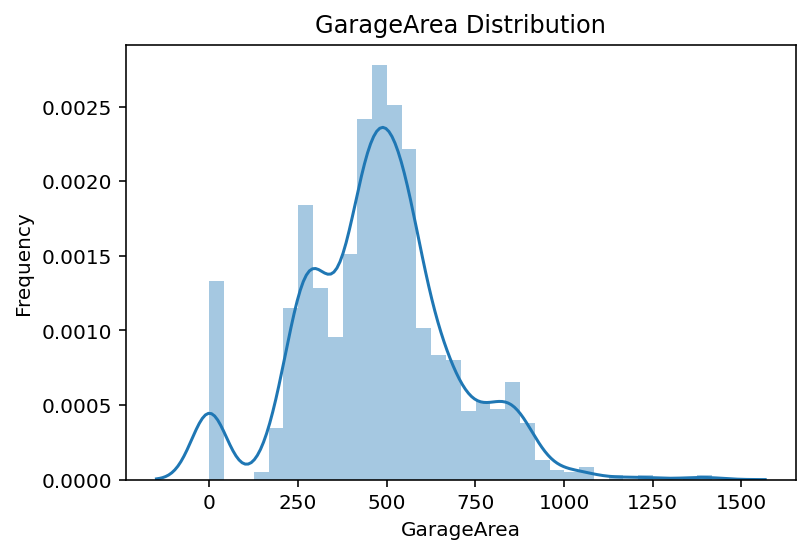

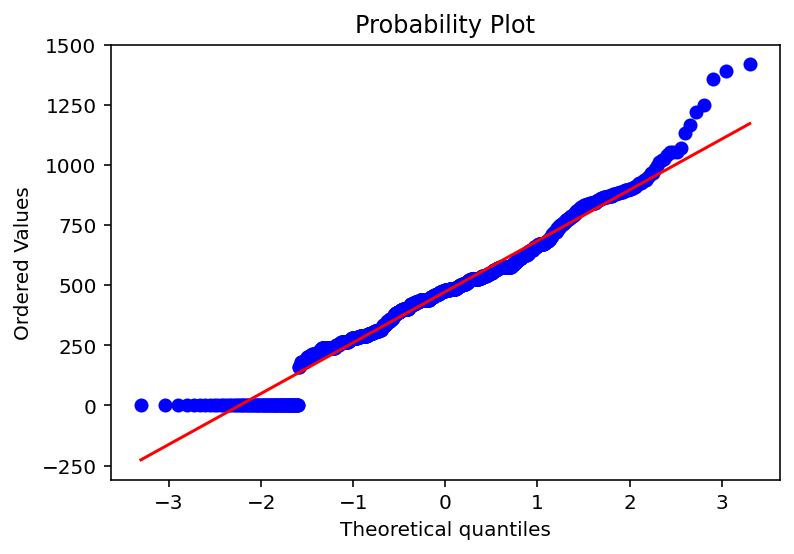

Skewness: 0.180
Kurtosis: 0.917


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


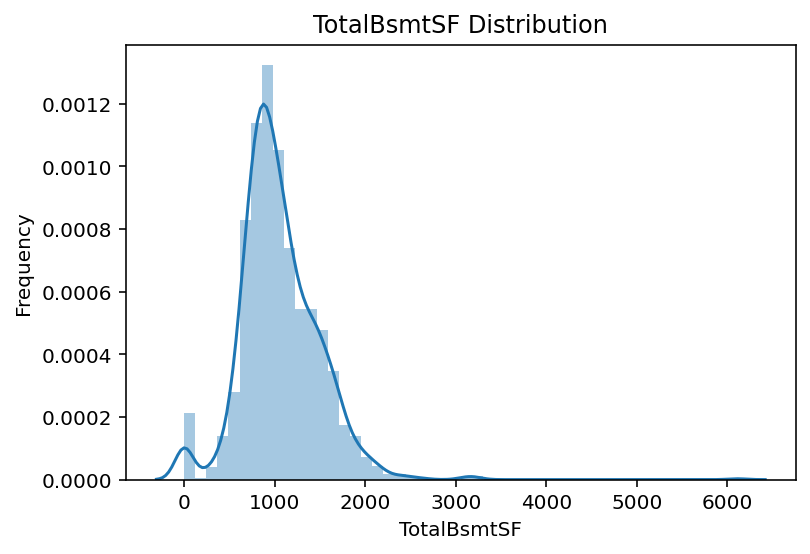

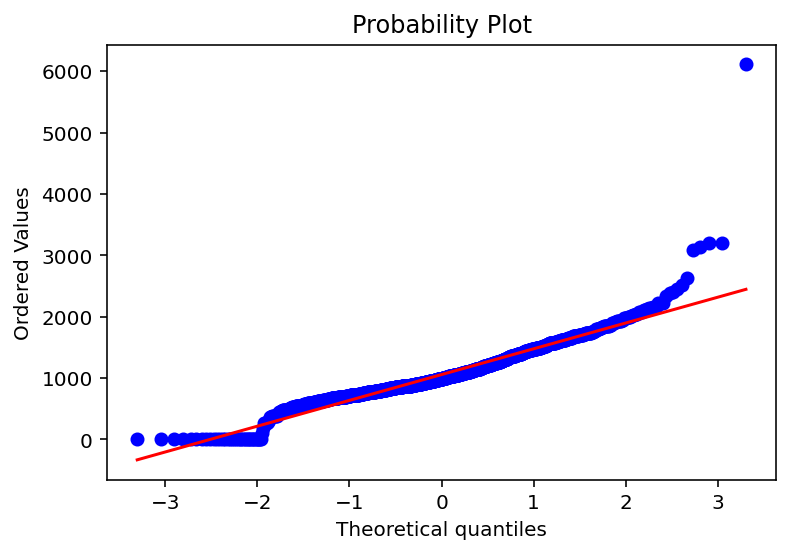

Skewness: 1.524
Kurtosis: 13.250


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


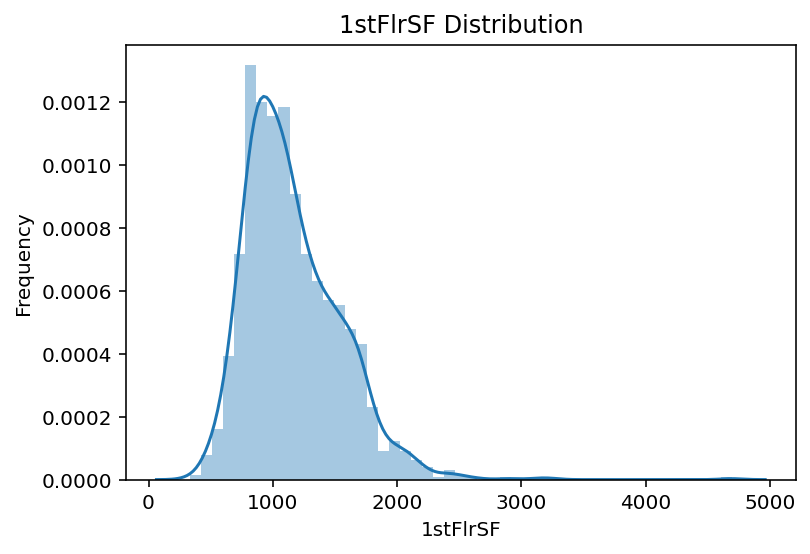

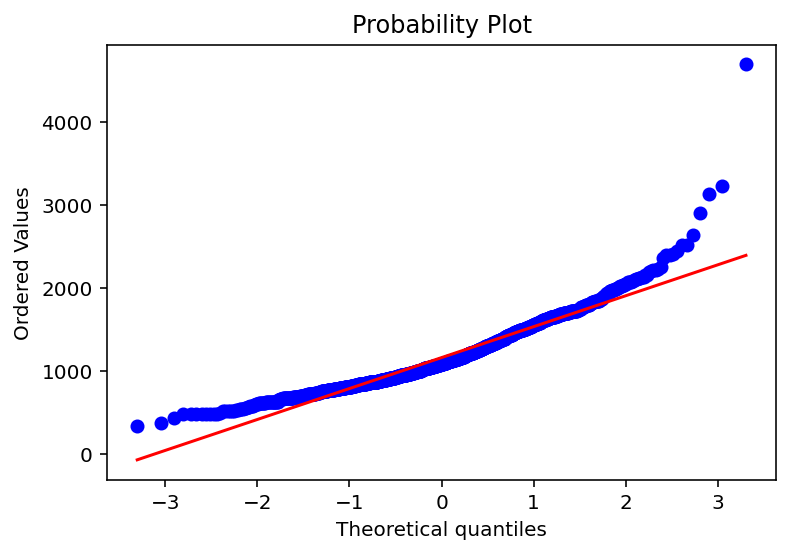

Skewness: 1.377
Kurtosis: 5.746


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


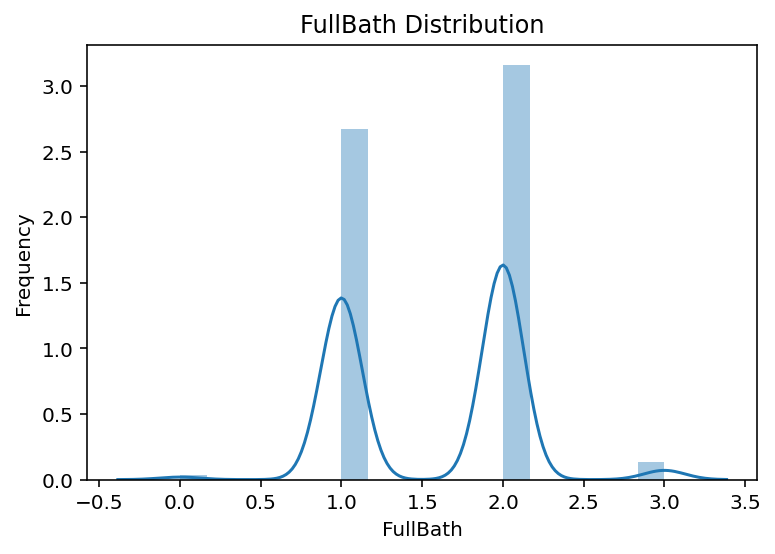

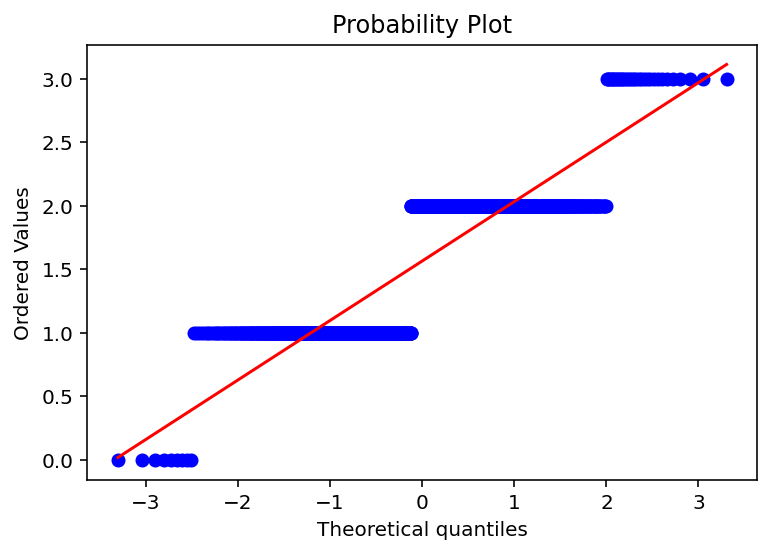

Skewness: 0.037
Kurtosis: -0.857


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


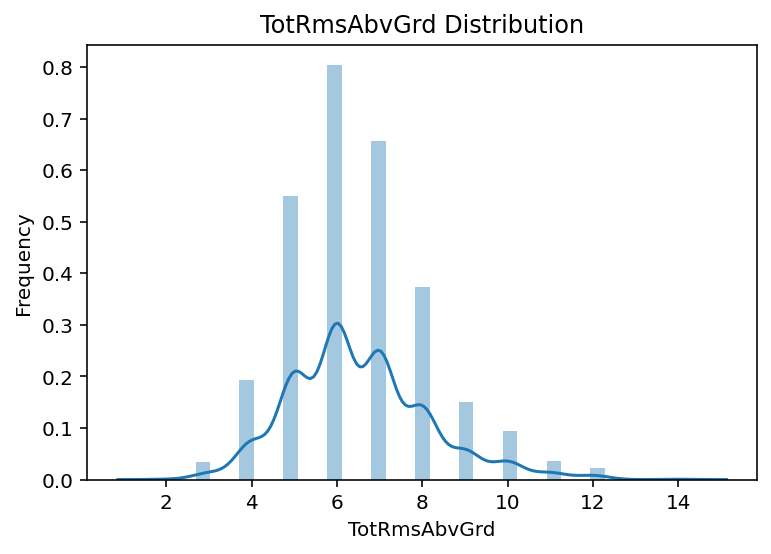

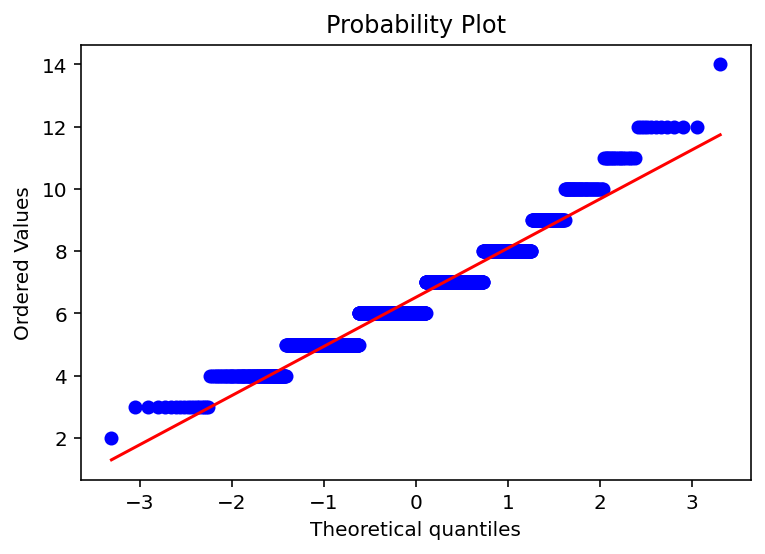

Skewness: 0.676
Kurtosis: 0.881


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


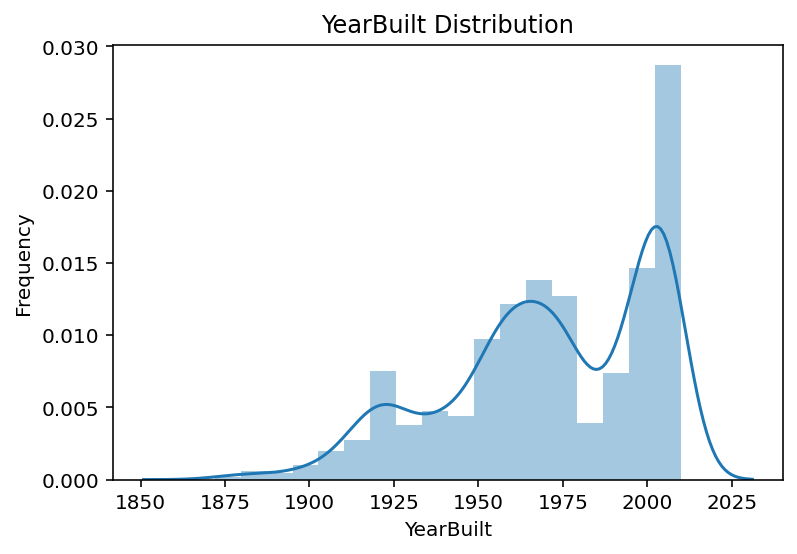

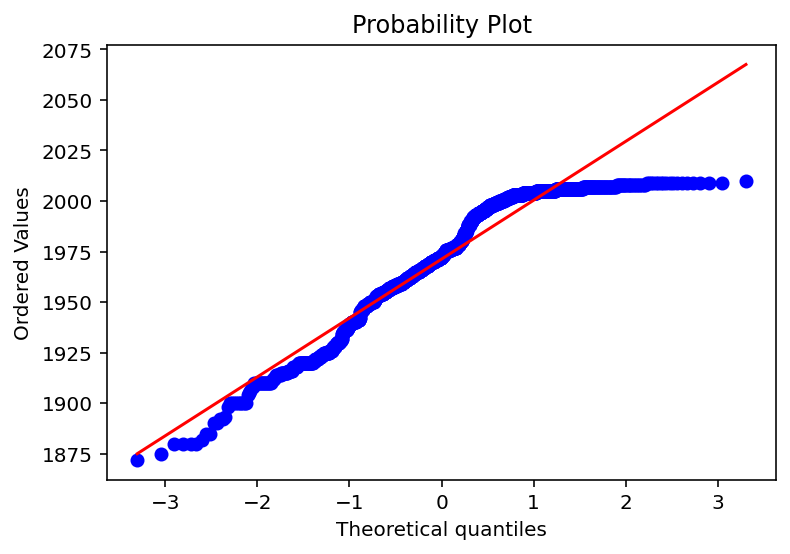

Skewness: -0.613
Kurtosis: -0.440


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


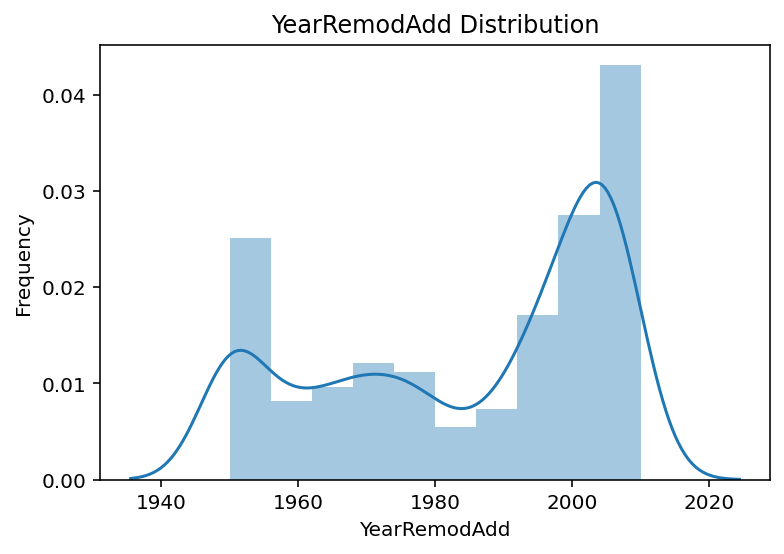

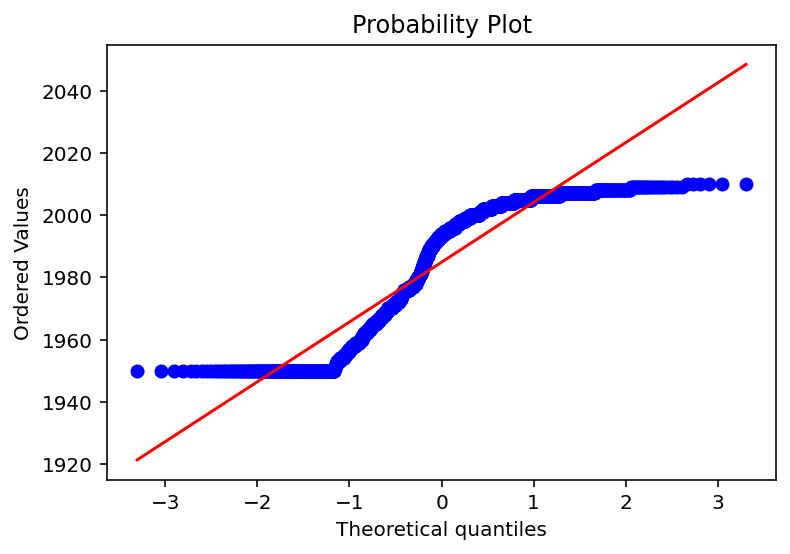

Skewness: -0.504
Kurtosis: -1.272


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


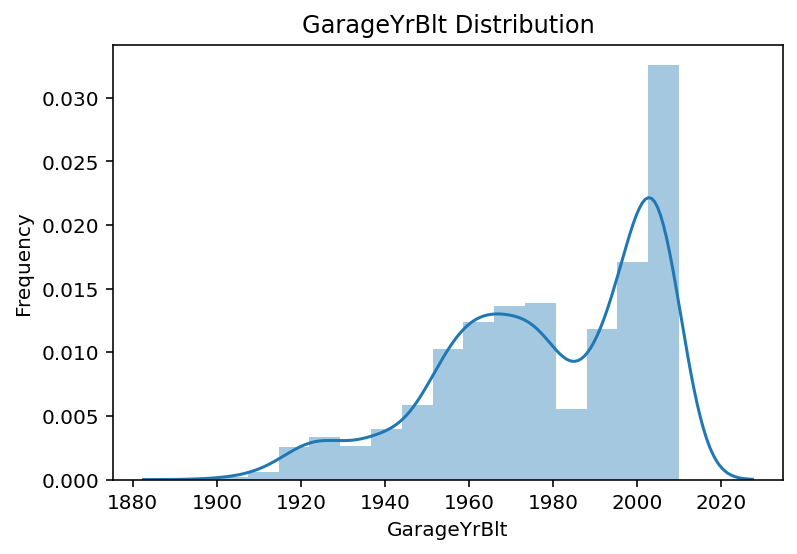

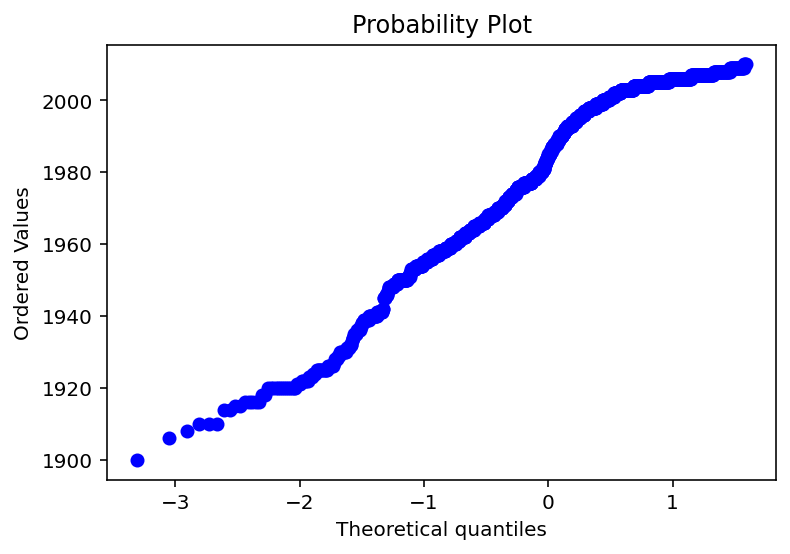

Skewness: -0.649
Kurtosis: -0.418


In [16]:
import scipy.stats as stats


for i in col:
    sns.distplot(train_df[i])
    plt.title(i+" Distribution")
    plt.ylabel('Frequency')
    plt.figure()
    qq = stats.probplot(train_df[i], plot=plt)
    plt.show()
    print("Skewness: {:.3f}".format(train_df[i].skew()))
    print("Kurtosis: {:.3f}".format(train_df[i].kurt()))
# For normally distributed data, the skewness should be about zero. 
# A skenewss  value greater than zero means that there is more weight in the left tail of the distribution

#print("Skewness: {:.3f}".format(train_df['SalePrice'].skew()))

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<Figure size 432x288 with 0 Axes>

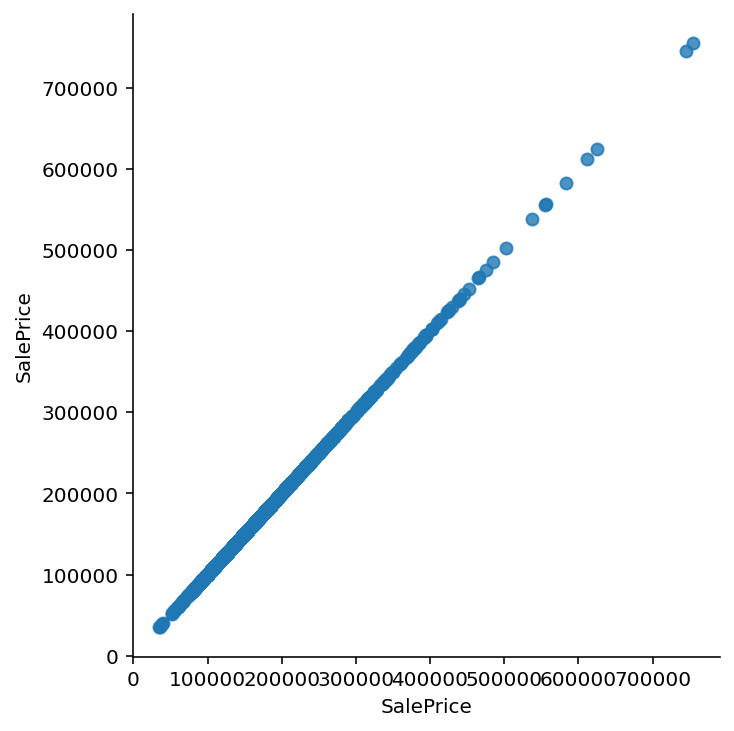

<Figure size 432x288 with 0 Axes>

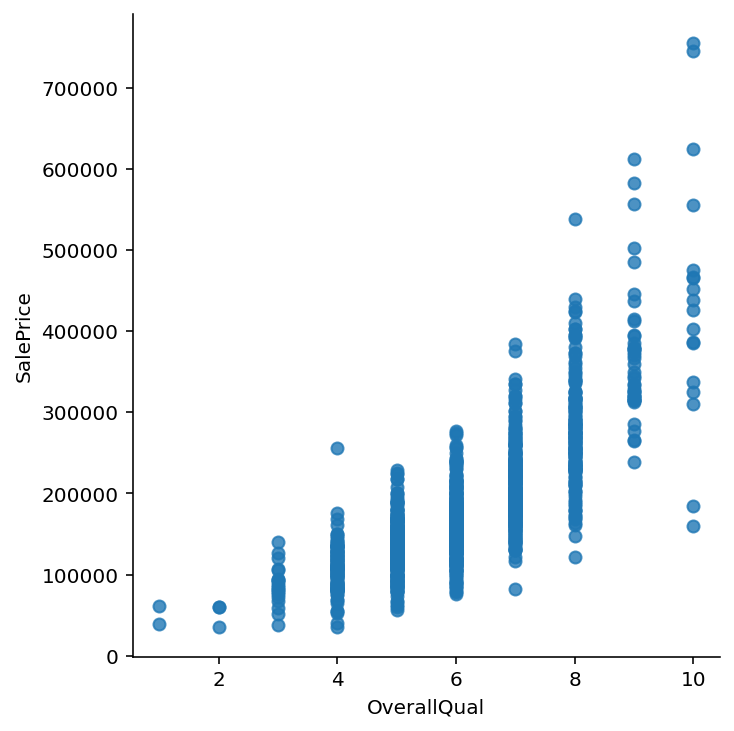

<Figure size 432x288 with 0 Axes>

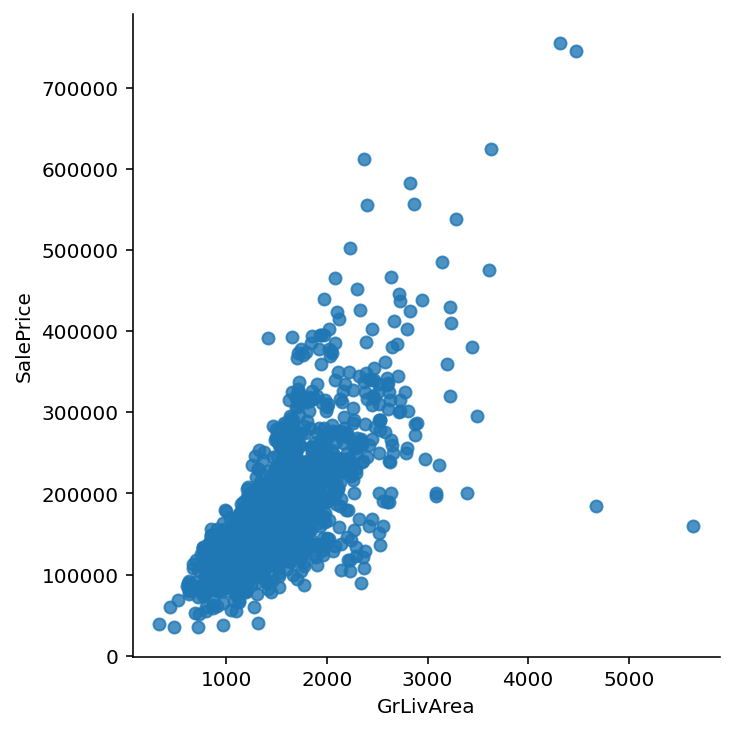

<Figure size 432x288 with 0 Axes>

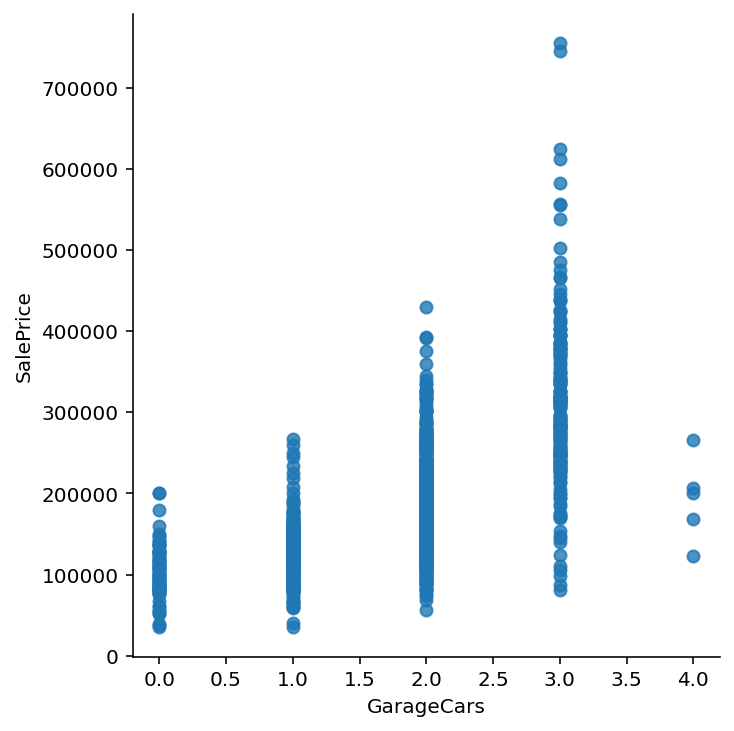

<Figure size 432x288 with 0 Axes>

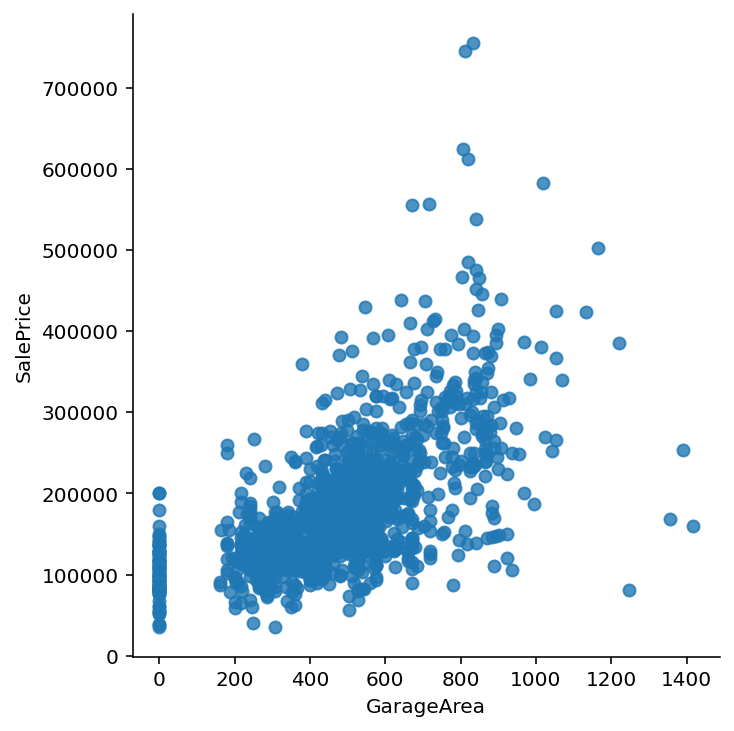

<Figure size 432x288 with 0 Axes>

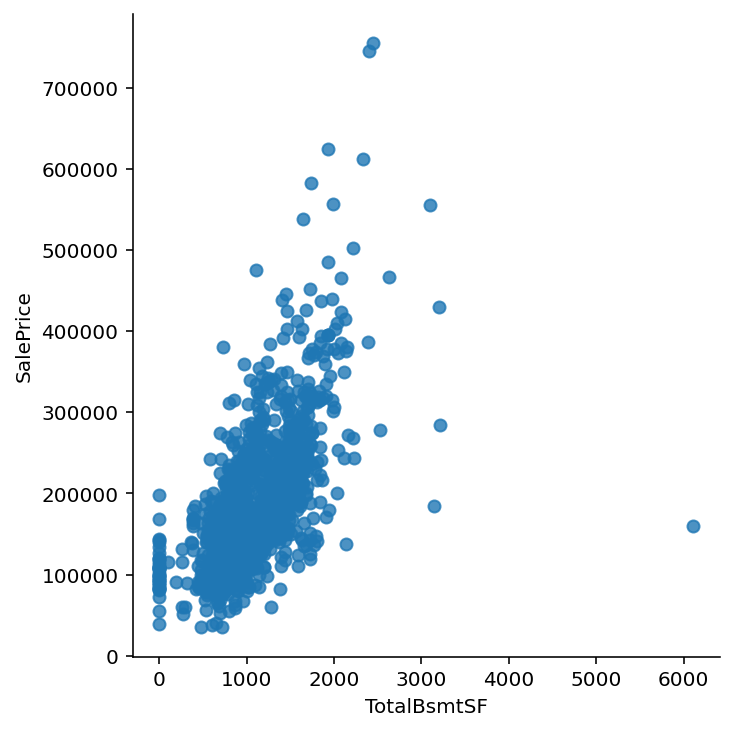

<Figure size 432x288 with 0 Axes>

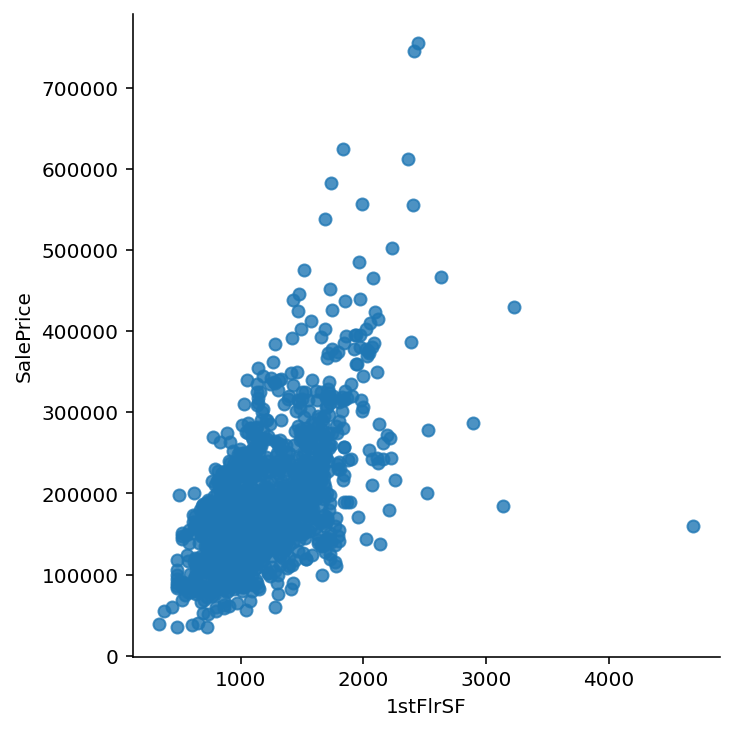

<Figure size 432x288 with 0 Axes>

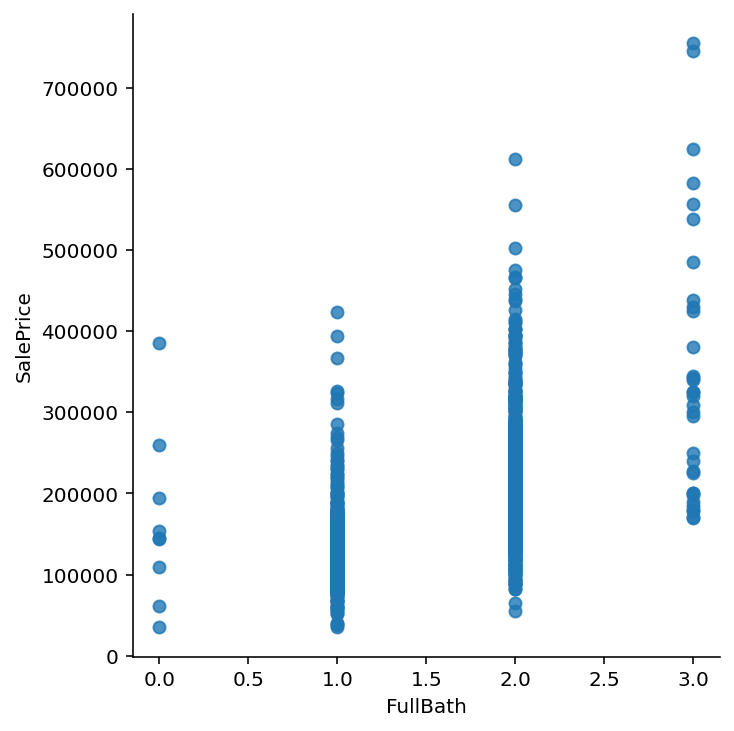

<Figure size 432x288 with 0 Axes>

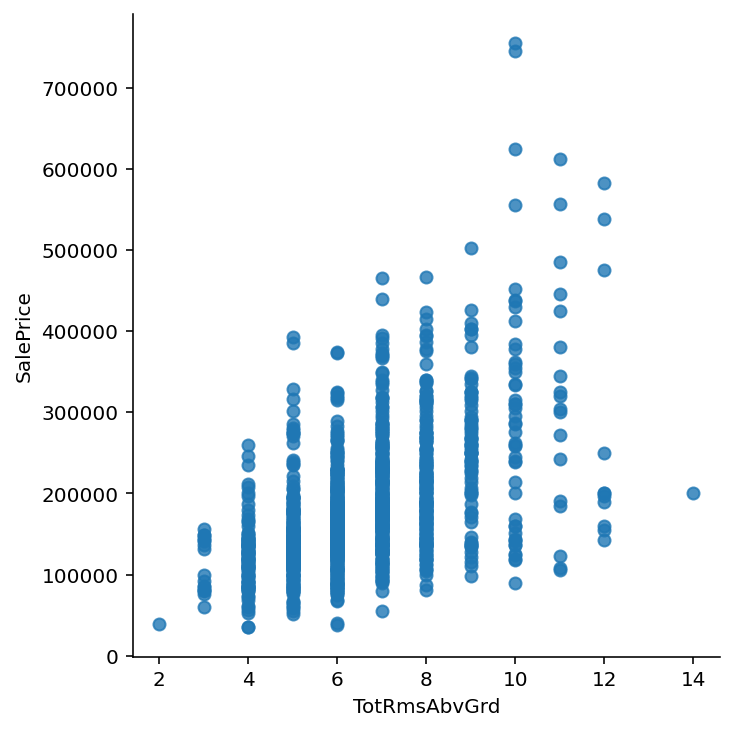

<Figure size 432x288 with 0 Axes>

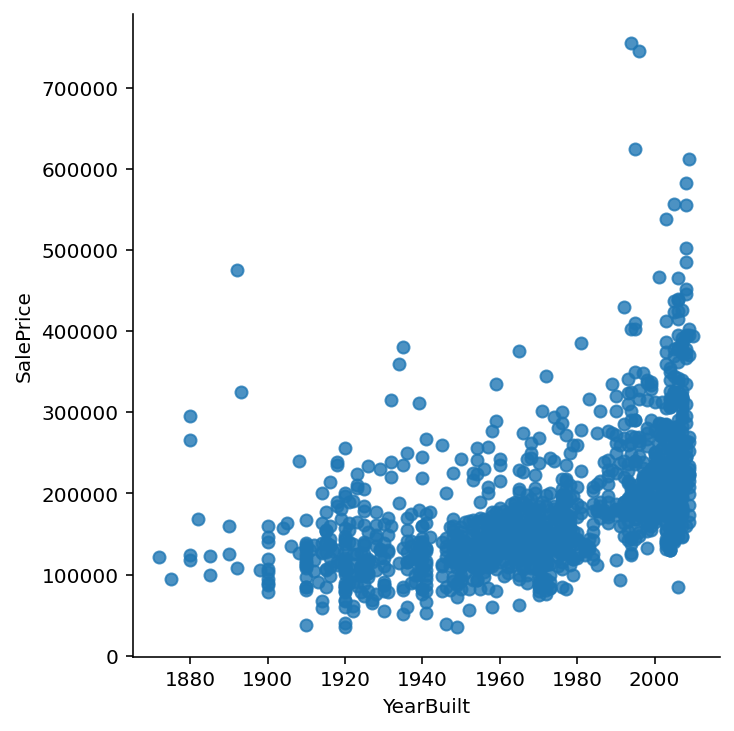

<Figure size 432x288 with 0 Axes>

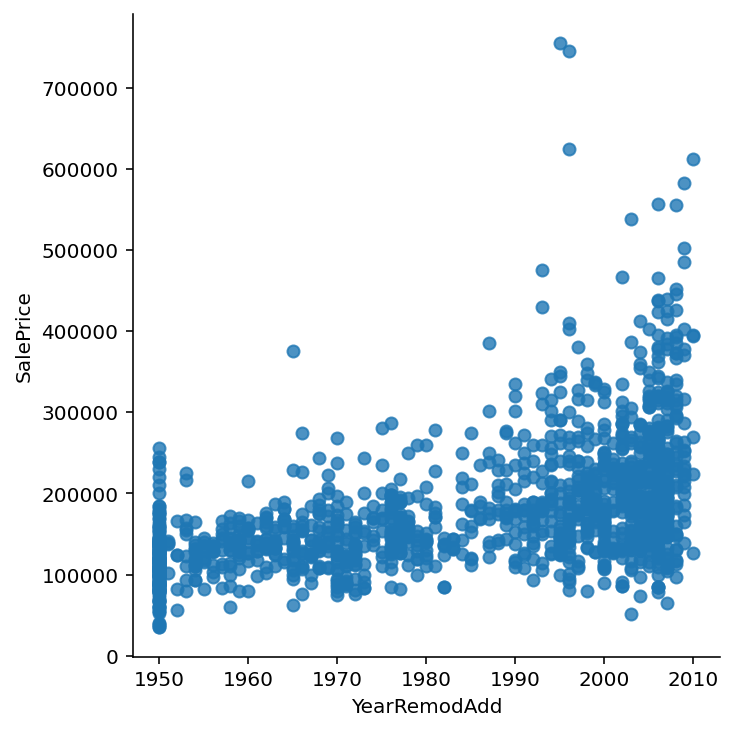

<Figure size 432x288 with 0 Axes>

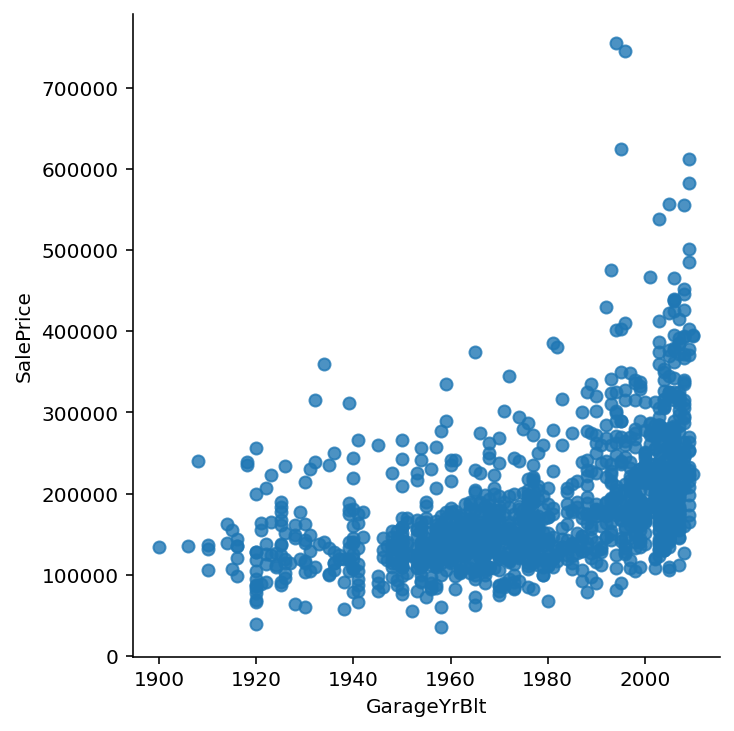

In [17]:
for i in col:
    plt.figure()
    otl = sns.lmplot(i, 'SalePrice',data=train_df, fit_reg=False)

In [18]:
# log1p calculates log(1 + input) because too high skewness

train_df['SalePrice'] = np.log1p(train_df['SalePrice'])

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


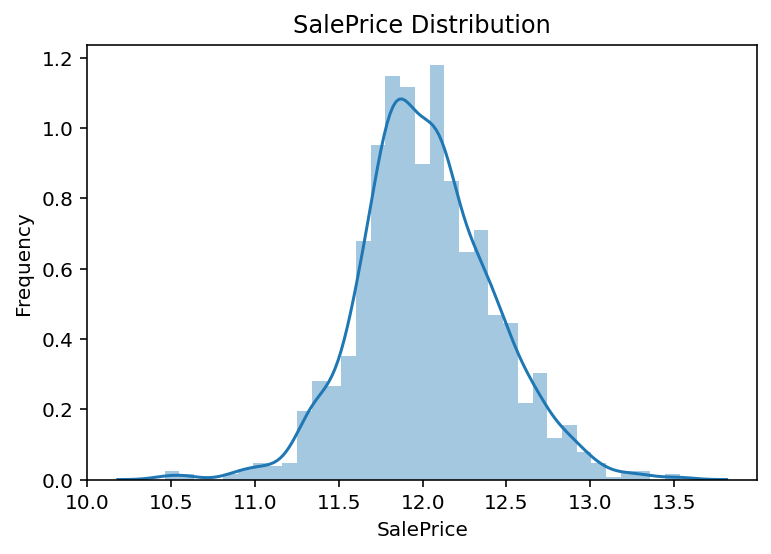

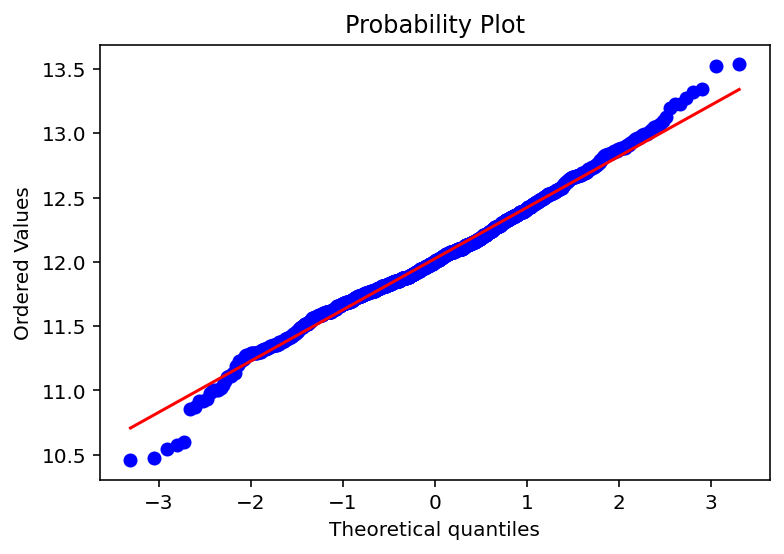

Skewness: 0.121
Kurtosis: 0.810


In [19]:
import scipy.stats as stats
sns.distplot(train_df['SalePrice'])
plt.title('SalePrice Distribution')
plt.ylabel('Frequency')

plt.figure()
qq = stats.probplot(train_df['SalePrice'], plot=plt)
plt.show()

# For normally distributed data, the skewness should be about zero. 
# A skenewss  value greater than zero means that there is more weight in the left tail of the distribution

print("Skewness: {:.3f}".format(train_df['SalePrice'].skew()))
print("Kurtosis: {:.3f}".format(train_df['SalePrice'].kurt()))

In [20]:
train_df.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,12.072547
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,12.254868
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,12.493133
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,11.864469
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,11.901590


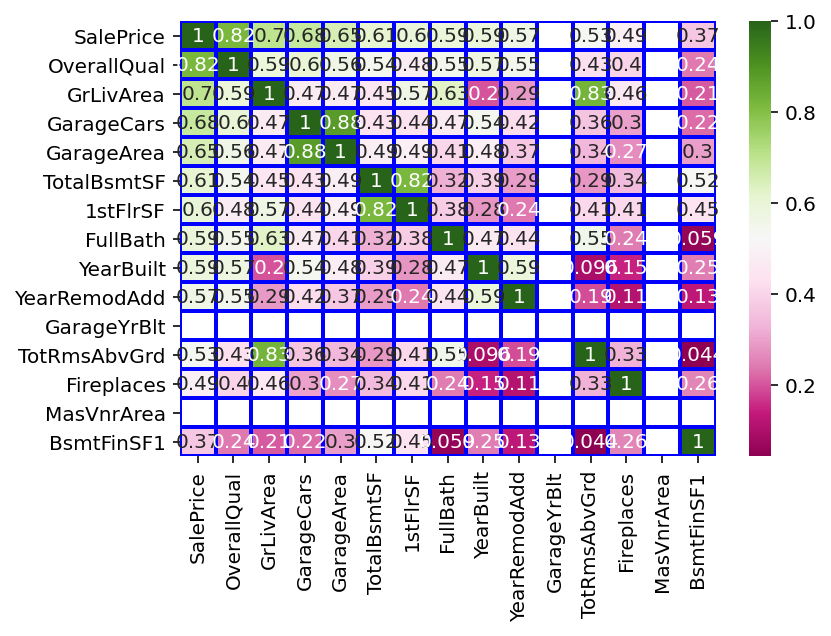

In [21]:

# correlation table
corr_train = train_df.corr()

# select top 15 highly correlated variables with SalePrice
num = 15
col = corr_train.nlargest(num, 'SalePrice')['SalePrice'].index
coeff = np.corrcoef(train_df[col].values.T)

# heatmap
heatmp = sns.heatmap(coeff, annot = True, xticklabels = col.values, yticklabels = col.values, linewidth=2,cmap='PiYG', linecolor='blue')

/opt/conda/lib/python3.7/site-packages/seaborn/axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


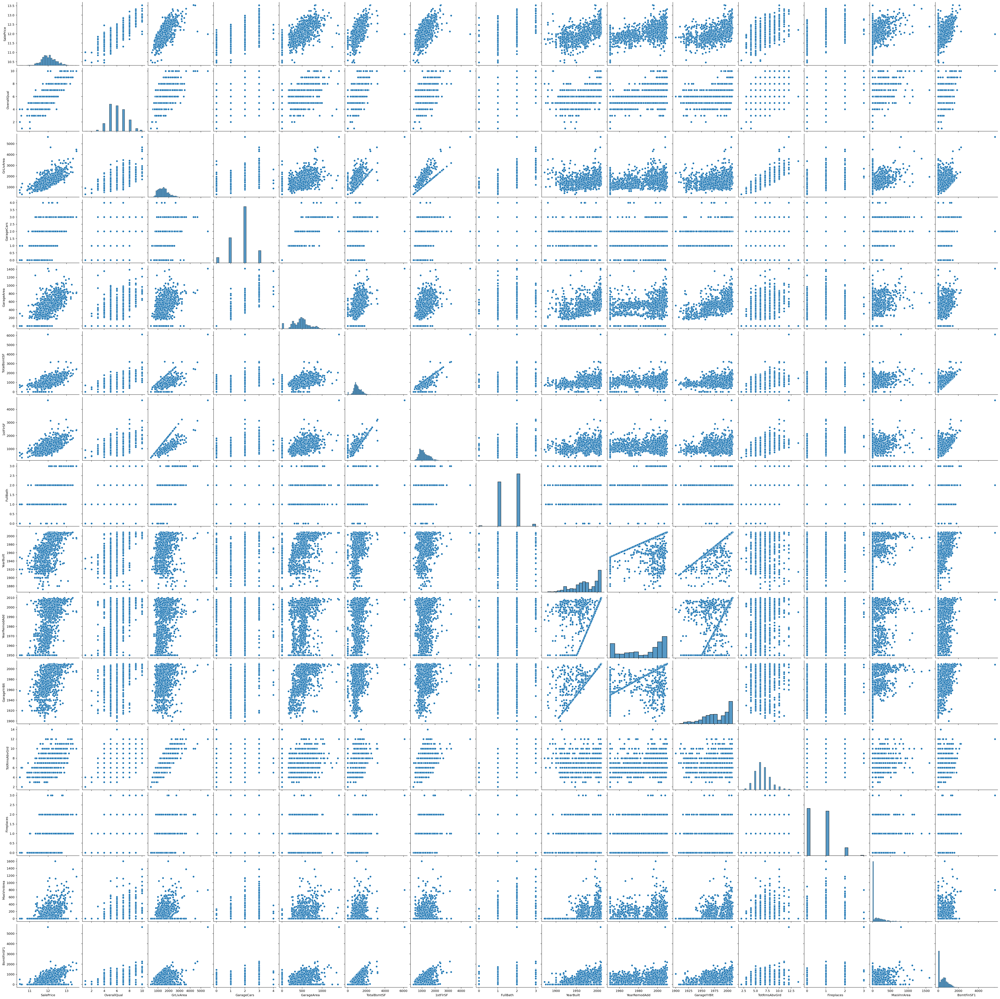

In [22]:
# Visualized the relationship between the target variable and top 10 features highly correlated with the target variable.

sns.pairplot(train_df[col], size=3);

In [23]:
y_ans=train_df['SalePrice']

In [24]:
print(y_ans)

0       12.247699
1       12.109016
2       12.317171
3       11.849405
4       12.429220
          ...    
1455    12.072547
1456    12.254868
1457    12.493133
1458    11.864469
1459    11.901590
Name: SalePrice, Length: 1460, dtype: float64


In [25]:
pd.set_option('display.max_rows', 100)

In [26]:
train_df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [27]:
train_df.isnull().sum().sum()

6965

In [28]:
y_id=test_df['Id']

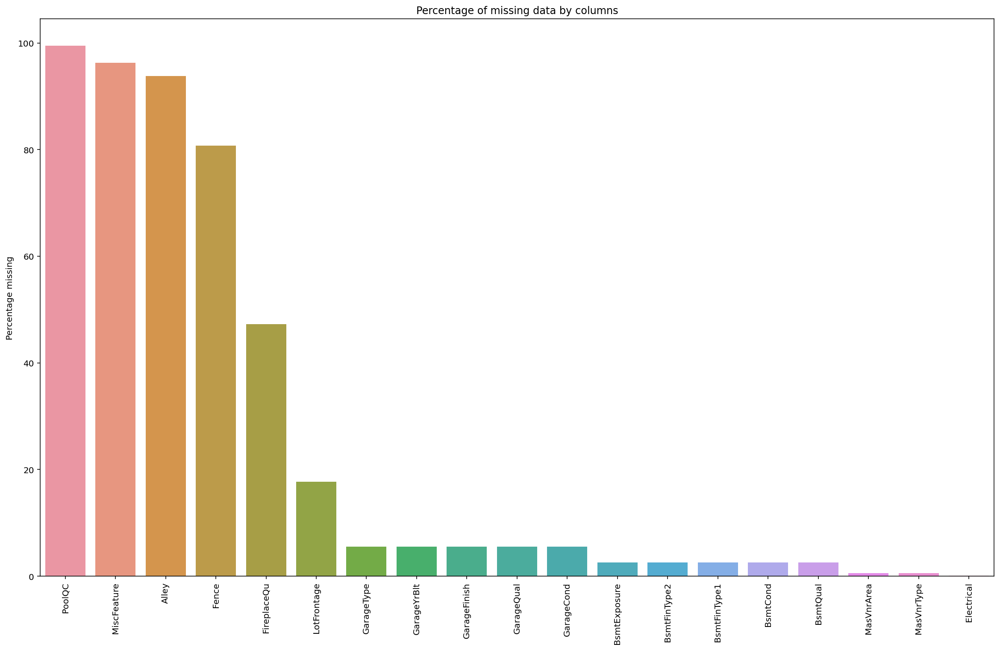

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

missing_percentage=(train_df.isnull().sum()/len(train_df))*100
missing_percentage=missing_percentage.drop(missing_percentage[missing_percentage==0].index).sort_values(ascending=False)

f, ax=plt.subplots(figsize=(20,12))
plt.xticks(rotation=90)
sns.barplot(x=missing_percentage.index, y=missing_percentage)
ax.set(title='Percentage of missing data by columns',ylabel="Percentage missing")
plt.show()

In [30]:
#drop columns where the missing values are at least 60% of the data
train_df.drop('PoolQC', axis=1, inplace=True)
train_df.drop('MiscFeature', axis=1, inplace=True)
train_df.drop('Alley', axis=1, inplace=True)
train_df.drop('Fence', axis=1, inplace=True)
train_df.drop('Id', axis=1, inplace=True)
#train_df.drop('FireplaceQu', axis=1, inplace=True)
test_df.drop('Id', axis=1, inplace=True)
test_df.drop('PoolQC', axis=1, inplace=True)
test_df.drop('MiscFeature', axis=1, inplace=True)
test_df.drop('Alley', axis=1, inplace=True)
test_df.drop('Fence', axis=1, inplace=True)

In [31]:
train_df.isnull().sum().sum()

1558

In [32]:
train_df.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinSF1         0
BsmtFinType2      38
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath     

In [33]:
mc = pd.DataFrame(train_df.isnull().sum(),columns=['Missing Count'])
mc = mc[mc['Missing Count']!=0]
mc['Missing %'] = (mc['Missing Count'] / train_df.shape[0]) * 100
mc.sort_values('Missing %',ascending=False)

,Missing Count,Missing %
FireplaceQu,690,47.260274
LotFrontage,259,17.739726
GarageType,81,5.547945
GarageYrBlt,81,5.547945
GarageFinish,81,5.547945
GarageQual,81,5.547945
GarageCond,81,5.547945
BsmtExposure,38,2.602740
BsmtFinType2,38,2.602740
BsmtQual,37,2.534247


In [34]:
train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,12.247699
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,12.109016
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,12.317171
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,11.849405
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,12.429220


In [35]:
train_df.tail()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,8,2007,WD,Normal,12.072547
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2010,WD,Normal,12.254868
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,2500,5,2010,WD,Normal,12.493133
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,112,0,0,0,0,4,2010,WD,Normal,11.864469
1459,20,RL,75.0,9937,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,6,2008,WD,Normal,11.901590


In [36]:
trainwithoutPrice=pd.DataFrame()
trainwithoutPrice=train_df.copy()

In [37]:
trainwithoutPrice.head(5)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,12.247699
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,12.109016
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,12.317171
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,11.849405
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,12.429220


In [38]:
trainwithoutPrice.drop('SalePrice', axis=1, inplace=True)

In [39]:
# choose categorical and continuous features from data


categorical_columns = [c for c in trainwithoutPrice.columns 
                       if trainwithoutPrice[c].dtype.name == 'object']
numerical_columns = [c for c in trainwithoutPrice.columns 
                     if trainwithoutPrice[c].dtype.name != 'object']

print('categorical_columns:', categorical_columns)
print('numerical_columns:', numerical_columns)

categorical_columns: ['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
numerical_columns: ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedP

In [41]:
#delete inconsistencies is by removing whitespaces before or after entry names and by converting all cases to lower cases
#train_df[categorical_columns]=train_df[categorical_columns].str.lower().strip()
catlist=['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
for c in catlist:
    train_df[c].str.lower()
    train_df[c].str.strip()

In [42]:
train_df.tail()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,8,2007,WD,Normal,12.072547
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2010,WD,Normal,12.254868
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,2500,5,2010,WD,Normal,12.493133
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,112,0,0,0,0,4,2010,WD,Normal,11.864469
1459,20,RL,75.0,9937,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,6,2008,WD,Normal,11.901590


In [43]:
# fill missing data
for c in categorical_columns:
    train_df[c].fillna(train_df[c].mode()[0], inplace=True)
    test_df[c].fillna(test_df[c].mode()[0], inplace=True)
    
for c in numerical_columns:
    train_df[c].fillna(train_df[c].median(), inplace=True)
    test_df[c].fillna(test_df[c].median(), inplace=True)

In [44]:
### copy categorical columns
categorical_train_df=pd.DataFrame()
categorical_train_df=train_df[categorical_columns].copy()

### copy categorical columns
categorical_test_df=pd.DataFrame()
categorical_test_df=test_df[categorical_columns].copy()

In [45]:
train_df[numerical_columns].head(5)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,548,0,61,0,0,0,0,0,2,2008
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,460,298,0,0,0,0,0,0,5,2007
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,608,0,42,0,0,0,0,0,9,2008
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,642,0,35,272,0,0,0,0,2,2006
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,836,192,84,0,0,0,0,0,12,2008


In [46]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler()
# Fit your data on the scaler object
scaled_train_df = scaler.fit_transform(train_df[numerical_columns])
scaled_train_df = pd.DataFrame(scaled_train_df, columns=train_df[numerical_columns].columns)

scaled_test_df = scaler.fit_transform(test_df[numerical_columns])
scaled_test_df = pd.DataFrame(scaled_test_df, columns=test_df[numerical_columns].columns)

In [47]:
scaled_train_df[numerical_columns].head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0.351000,-0.752176,0.216503,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,0.138777
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,-0.060731,1.626195,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.489110,-0.614439
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0.631726,-0.752176,-0.070361,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.990891,0.138777
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0.790804,-0.752176,-0.176048,4.092524,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,-1.367655
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,1.698485,0.780197,0.563760,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,2.100892,0.138777
5,-0.163109,0.687385,0.360616,-0.795151,-0.517200,0.719786,0.491040,-0.570750,0.632450,-0.288653,...,0.032844,-0.432931,-0.251539,-0.359325,10.802446,-0.270208,-0.068692,1.323736,1.360892,0.891994
6,-0.872563,0.233255,-0.043379,1.374795,-0.517200,1.084115,0.975575,0.458754,2.029558,-0.288653,...,0.762732,1.283007,0.156111,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.620891,-0.614439
7,0.073375,-0.039223,-0.013513,0.651479,0.381743,0.057371,-0.574938,0.757643,0.910994,-0.090220,...,0.051559,1.123385,2.375537,3.372372,-0.116339,-0.270208,-0.068692,0.618024,1.730892,0.891994
8,-0.163109,-0.856657,-0.440659,0.651479,-0.517200,-1.333700,-1.689368,-0.570750,-0.973018,-0.288653,...,-0.023301,-0.033876,-0.704483,2.995929,-0.116339,-0.270208,-0.068692,-0.087688,-0.859110,0.138777
9,3.147673,-0.902070,-0.310370,-0.795151,0.381743,-1.068734,-1.689368,-0.570750,0.893448,-0.288653,...,-1.253816,-0.752176,-0.644091,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.969111,0.138777


In [48]:
scaled_train_df[numerical_columns].tail()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,-0.060731,-0.752176,-0.100558,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.620891,-0.614439
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0.126420,2.033231,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,1.645210
1457,0.309859,-0.175462,-0.147810,0.651479,3.078570,-1.002492,1.024029,-0.570750,-0.369871,-0.288653,...,-1.033914,-0.752176,0.201405,-0.359325,-0.116339,-0.270208,-0.068692,4.953112,-0.489110,1.645210
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,-1.090059,2.168910,-0.704483,1.473789,-0.116339,-0.270208,-0.068692,-0.087688,-0.859110,1.645210
1459,-0.872563,0.233255,-0.058112,-0.795151,0.381743,-0.207594,-0.962566,-0.570750,0.847389,1.509640,...,-0.921624,5.121921,0.322190,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.119110,0.138777


In [49]:
scaled_test_df.head(5)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,-0.874711,0.567330,0.363929,-0.751101,0.400766,-0.340945,-1.072885,-0.563316,0.063428,0.517537,...,1.185921,0.366678,-0.701628,-0.360738,-0.088827,1.818960,-0.057227,-0.092244,-0.038281,1.713905
1,-0.874711,0.615963,0.897861,-0.054877,0.400766,-0.439695,-1.214908,0.047057,1.063511,-0.297689,...,-0.741235,2.347867,-0.178826,-0.360738,-0.088827,-0.301543,-0.057227,19.730438,-0.038281,1.713905
2,0.061351,0.275532,0.809646,-0.751101,-0.497418,0.844059,0.678742,-0.563316,0.773377,-0.297689,...,0.042537,0.930495,-0.207871,-0.360738,-0.088827,-0.301543,-0.057227,-0.092244,-1.140614,1.713905
3,0.061351,0.470064,0.032064,-0.054877,0.400766,0.876976,0.678742,-0.450284,0.357958,-0.297689,...,-0.012788,2.089451,-0.178826,-0.360738,-0.088827,-0.301543,-0.057227,-0.092244,-0.038281,1.713905
4,1.465443,-1.232092,-0.971808,1.337571,-0.497418,0.679475,0.394694,-0.563316,-0.387160,-0.297689,...,0.153187,-0.729632,0.489198,-0.360738,-0.088827,2.243060,-0.057227,-0.092244,-1.875504,1.713905


In [50]:
scaled_train_df = pd.concat([scaled_train_df[numerical_columns],
    categorical_train_df], axis=1)

In [51]:
scaled_train_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,TA,Min1,TA,Attchd,Unf,TA,TA,Y,WD,Normal
1457,0.309859,-0.175462,-0.147810,0.651479,3.078570,-1.002492,1.024029,-0.570750,-0.369871,-0.288653,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,Gd,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal


In [52]:
scaled_test_df = pd.concat([scaled_test_df[numerical_columns],
    categorical_test_df], axis=1)

In [53]:
scaled_test_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,-0.874711,0.567330,0.363929,-0.751101,0.400766,-0.340945,-1.072885,-0.563316,0.063428,0.517537,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
1,-0.874711,0.615963,0.897861,-0.054877,0.400766,-0.439695,-1.214908,0.047057,1.063511,-0.297689,...,Gd,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
2,0.061351,0.275532,0.809646,-0.751101,-0.497418,0.844059,0.678742,-0.563316,0.773377,-0.297689,...,TA,Typ,TA,Attchd,Fin,TA,TA,Y,WD,Normal
3,0.061351,0.470064,0.032064,-0.054877,0.400766,0.876976,0.678742,-0.450284,0.357958,-0.297689,...,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y,WD,Normal
4,1.465443,-1.232092,-0.971808,1.337571,-0.497418,0.679475,0.394694,-0.563316,-0.387160,-0.297689,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2.401505,-2.302019,-1.591330,-1.447325,1.298950,-0.044694,-0.646813,-0.563316,-0.965230,-0.297689,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
1455,2.401505,-2.302019,-1.599808,-1.447325,-0.497418,-0.044694,-0.646813,-0.563316,-0.411338,-0.297689,...,TA,Typ,Gd,CarPort,Unf,TA,TA,Y,WD,Abnorml
1456,-0.874711,4.457971,2.055150,-0.751101,1.298950,-0.373861,0.584059,-0.563316,1.725105,-0.297689,...,TA,Typ,TA,Detchd,Unf,TA,TA,Y,WD,Abnorml
1457,0.646389,-0.308065,0.125527,-0.751101,-0.497418,0.679475,0.394694,-0.563316,-0.224509,-0.297689,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal


In [54]:
categorical_columns = [c for c in scaled_train_df.columns 
                       if scaled_train_df[c].dtype.name == 'object']


print('categorical_columns:', categorical_columns)
print('numerical_columns:', numerical_columns)
print(scaled_train_df[categorical_columns])

categorical_columns: ['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
numerical_columns: ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedP

In [55]:
scaled_train_df[categorical_columns]

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
1456,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,...,TA,Min1,TA,Attchd,Unf,TA,TA,Y,WD,Normal
1457,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1458,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,...,Gd,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal


In [56]:
scaled_test_df[categorical_columns]

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RH,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
1,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,...,Gd,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,TA,Typ,TA,Attchd,Fin,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y,WD,Normal
4,RL,Pave,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,RM,Pave,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
1455,RM,Pave,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,...,TA,Typ,Gd,CarPort,Unf,TA,TA,Y,WD,Abnorml
1456,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,...,TA,Typ,TA,Detchd,Unf,TA,TA,Y,WD,Abnorml
1457,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal


In [57]:
np.isnan(scaled_train_df[numerical_columns].any()) 
#np.isfinite(mat.all()) #and gets True

MSSubClass       False
LotFrontage      False
LotArea          False
OverallQual      False
OverallCond      False
YearBuilt        False
YearRemodAdd     False
MasVnrArea       False
BsmtFinSF1       False
BsmtFinSF2       False
BsmtUnfSF        False
TotalBsmtSF      False
1stFlrSF         False
2ndFlrSF         False
LowQualFinSF     False
GrLivArea        False
BsmtFullBath     False
BsmtHalfBath     False
FullBath         False
HalfBath         False
BedroomAbvGr     False
KitchenAbvGr     False
TotRmsAbvGrd     False
Fireplaces       False
GarageYrBlt      False
GarageCars       False
GarageArea       False
WoodDeckSF       False
OpenPorchSF      False
EnclosedPorch    False
3SsnPorch        False
ScreenPorch      False
PoolArea         False
MiscVal          False
MoSold           False
YrSold           False
dtype: bool

In [58]:
np.isfinite(scaled_train_df[numerical_columns].all()) #and gets True

MSSubClass       True
LotFrontage      True
LotArea          True
OverallQual      True
OverallCond      True
YearBuilt        True
YearRemodAdd     True
MasVnrArea       True
BsmtFinSF1       True
BsmtFinSF2       True
BsmtUnfSF        True
TotalBsmtSF      True
1stFlrSF         True
2ndFlrSF         True
LowQualFinSF     True
GrLivArea        True
BsmtFullBath     True
BsmtHalfBath     True
FullBath         True
HalfBath         True
BedroomAbvGr     True
KitchenAbvGr     True
TotRmsAbvGrd     True
Fireplaces       True
GarageYrBlt      True
GarageCars       True
GarageArea       True
WoodDeckSF       True
OpenPorchSF      True
EnclosedPorch    True
3SsnPorch        True
ScreenPorch      True
PoolArea         True
MiscVal          True
MoSold           True
YrSold           True
dtype: bool

In [59]:
scaled_train_df[numerical_columns]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0.351000,-0.752176,0.216503,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,0.138777
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,-0.060731,1.626195,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.489110,-0.614439
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0.631726,-0.752176,-0.070361,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.990891,0.138777
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0.790804,-0.752176,-0.176048,4.092524,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,-1.367655
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,1.698485,0.780197,0.563760,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,2.100892,0.138777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,-0.060731,-0.752176,-0.100558,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.620891,-0.614439
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0.126420,2.033231,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,1.645210
1457,0.309859,-0.175462,-0.147810,0.651479,3.078570,-1.002492,1.024029,-0.570750,-0.369871,-0.288653,...,-1.033914,-0.752176,0.201405,-0.359325,-0.116339,-0.270208,-0.068692,4.953112,-0.489110,1.645210
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,-1.090059,2.168910,-0.704483,1.473789,-0.116339,-0.270208,-0.068692,-0.087688,-0.859110,1.645210


In [60]:
scaled_train_df[numerical_columns] = np.nan_to_num(scaled_train_df[numerical_columns])

In [61]:
scaled_train_df[numerical_columns]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0.351000,-0.752176,0.216503,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,0.138777
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,-0.060731,1.626195,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.489110,-0.614439
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0.631726,-0.752176,-0.070361,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.990891,0.138777
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0.790804,-0.752176,-0.176048,4.092524,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,-1.367655
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,1.698485,0.780197,0.563760,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,2.100892,0.138777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,-0.060731,-0.752176,-0.100558,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.620891,-0.614439
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0.126420,2.033231,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,1.645210
1457,0.309859,-0.175462,-0.147810,0.651479,3.078570,-1.002492,1.024029,-0.570750,-0.369871,-0.288653,...,-1.033914,-0.752176,0.201405,-0.359325,-0.116339,-0.270208,-0.068692,4.953112,-0.489110,1.645210
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,-1.090059,2.168910,-0.704483,1.473789,-0.116339,-0.270208,-0.068692,-0.087688,-0.859110,1.645210


In [62]:
scaled_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   float64
 1   LotFrontage    1460 non-null   float64
 2   LotArea        1460 non-null   float64
 3   OverallQual    1460 non-null   float64
 4   OverallCond    1460 non-null   float64
 5   YearBuilt      1460 non-null   float64
 6   YearRemodAdd   1460 non-null   float64
 7   MasVnrArea     1460 non-null   float64
 8   BsmtFinSF1     1460 non-null   float64
 9   BsmtFinSF2     1460 non-null   float64
 10  BsmtUnfSF      1460 non-null   float64
 11  TotalBsmtSF    1460 non-null   float64
 12  1stFlrSF       1460 non-null   float64
 13  2ndFlrSF       1460 non-null   float64
 14  LowQualFinSF   1460 non-null   float64
 15  GrLivArea      1460 non-null   float64
 16  BsmtFullBath   1460 non-null   float64
 17  BsmtHalfBath   1460 non-null   float64
 18  FullBath

In [63]:
#### solve the problem with zeros
for c in categorical_columns:
    scaled_train_df[c].fillna(scaled_train_df[c].mode()[0], inplace=True)
    #test_df[c].fillna(test_df[c].mode()[0], inplace=True)
    
for c in numerical_columns:
    scaled_train_df[c].fillna(scaled_train_df[c].median(), inplace=True)
    #test_df[c].fillna(test_df[c].median(), inplace=True)

In [64]:
scaled_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   float64
 1   LotFrontage    1460 non-null   float64
 2   LotArea        1460 non-null   float64
 3   OverallQual    1460 non-null   float64
 4   OverallCond    1460 non-null   float64
 5   YearBuilt      1460 non-null   float64
 6   YearRemodAdd   1460 non-null   float64
 7   MasVnrArea     1460 non-null   float64
 8   BsmtFinSF1     1460 non-null   float64
 9   BsmtFinSF2     1460 non-null   float64
 10  BsmtUnfSF      1460 non-null   float64
 11  TotalBsmtSF    1460 non-null   float64
 12  1stFlrSF       1460 non-null   float64
 13  2ndFlrSF       1460 non-null   float64
 14  LowQualFinSF   1460 non-null   float64
 15  GrLivArea      1460 non-null   float64
 16  BsmtFullBath   1460 non-null   float64
 17  BsmtHalfBath   1460 non-null   float64
 18  FullBath

In [65]:
from sklearn.ensemble import IsolationForest
model=IsolationForest(n_estimators=50, max_samples='auto', contamination=float(0.1),max_features=1.0)
model.fit(scaled_train_df[numerical_columns])

IsolationForest(contamination=0.1, n_estimators=50)

In [66]:
scaled_train_df['scores']=model.decision_function(scaled_train_df[numerical_columns])
scaled_train_df['anomaly']=model.predict(scaled_train_df[numerical_columns])
scaled_train_df.tail(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,scores,anomaly
1440,0.309859,0.414907,0.101141,-0.071836,1.280685,-1.631786,0.442586,-0.570750,-0.973018,-0.288653,...,Gd,Detchd,Fin,TA,TA,Y,WD,Normal,0.009232,1
1441,1.492282,-0.039223,-0.610435,-0.071836,-0.517200,1.084115,0.927122,0.242890,0.555685,-0.288653,...,TA,Attchd,RFn,TA,TA,Y,WD,Normal,0.066309,1
1442,0.073375,0.687385,0.048725,2.821425,-0.517200,1.216598,1.120936,0.314845,0.704827,-0.288653,...,Ex,Attchd,Fin,TA,TA,Y,WD,Normal,0.056552,1
1443,-0.636078,-0.039223,-0.166652,-0.071836,0.381743,-1.830511,-1.689368,-0.570750,-0.973018,-0.288653,...,Gd,Detchd,Unf,Fa,Po,P,WD,Normal,0.037316,1
1444,-0.872563,-0.311701,-0.202131,0.651479,-0.517200,1.084115,0.927122,0.015957,-0.973018,-0.288653,...,Gd,Attchd,RFn,TA,TA,Y,WD,Normal,0.093354,1
1445,0.664586,0.006190,-0.212153,-0.071836,-0.517200,-0.174474,-0.914112,-0.570750,-0.562878,3.599381,...,Gd,Detchd,Unf,TA,TA,Y,WD,Normal,0.052047,1
1446,-0.872563,-0.039223,1.565986,-0.795151,1.280685,-0.306957,-1.107926,0.475359,0.327586,-0.288653,...,Gd,Attchd,Unf,TA,TA,P,WD,Normal,0.080916,1
1447,0.073375,0.460320,-0.051798,1.374795,-0.517200,0.786028,0.539493,1.853567,1.393512,-0.288653,...,TA,Attchd,RFn,TA,TA,Y,WD,Normal,0.083077,1
1448,-0.163109,0.006190,0.125295,-1.518467,1.280685,-2.029235,0.733308,-0.570750,-0.973018,-0.288653,...,Gd,Detchd,Unf,Fa,TA,Y,WD,Normal,0.065113,1
1449,2.911188,-2.219047,-0.900377,-0.795151,1.280685,-0.041991,-0.720298,-0.570750,0.239856,-0.288653,...,Gd,Attchd,Unf,TA,TA,Y,WD,Abnorml,-0.018807,-1


In [67]:
#delete anomaly ==-1 from train_df
scaled_train_df.drop(scaled_train_df.loc[scaled_train_df['anomaly']==-1].index, inplace=True) 

In [68]:
scaled_train_df.head(20)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,scores,anomaly
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,Gd,Attchd,RFn,TA,TA,Y,WD,Normal,0.096676,1
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,TA,Attchd,RFn,TA,TA,Y,WD,Normal,0.022565,1
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,TA,Attchd,RFn,TA,TA,Y,WD,Normal,0.109770,1
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml,0.019238,1
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,TA,Attchd,RFn,TA,TA,Y,WD,Normal,0.073477,1
5,-0.163109,0.687385,0.360616,-0.795151,-0.517200,0.719786,0.491040,-0.570750,0.632450,-0.288653,...,Gd,Attchd,Unf,TA,TA,Y,WD,Normal,0.021723,1
6,-0.872563,0.233255,-0.043379,1.374795,-0.517200,1.084115,0.975575,0.458754,2.029558,-0.288653,...,Gd,Attchd,RFn,TA,TA,Y,WD,Normal,0.070980,1
7,0.073375,-0.039223,-0.013513,0.651479,0.381743,0.057371,-0.574938,0.757643,0.910994,-0.090220,...,TA,Attchd,RFn,TA,TA,Y,WD,Normal,0.028836,1
10,-0.872563,0.006190,0.068469,-0.795151,-0.517200,-0.207594,-0.962566,-0.570750,1.014077,-0.288653,...,Gd,Detchd,Unf,TA,TA,Y,WD,Normal,0.116429,1
11,0.073375,0.687385,0.141030,2.098110,-0.517200,1.117235,1.024029,1.012251,1.215857,-0.288653,...,Gd,BuiltIn,Fin,TA,TA,Y,New,Partial,0.010888,1


In [69]:
scaled_train_df.drop('scores', axis=1, inplace=True)
scaled_train_df.drop('anomaly', axis=1, inplace=True)

In [ ]:
#working only with scaled_train_df !!!!! and scaled_test_df


In [70]:
scaled_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1314 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1314 non-null   float64
 1   LotFrontage    1314 non-null   float64
 2   LotArea        1314 non-null   float64
 3   OverallQual    1314 non-null   float64
 4   OverallCond    1314 non-null   float64
 5   YearBuilt      1314 non-null   float64
 6   YearRemodAdd   1314 non-null   float64
 7   MasVnrArea     1314 non-null   float64
 8   BsmtFinSF1     1314 non-null   float64
 9   BsmtFinSF2     1314 non-null   float64
 10  BsmtUnfSF      1314 non-null   float64
 11  TotalBsmtSF    1314 non-null   float64
 12  1stFlrSF       1314 non-null   float64
 13  2ndFlrSF       1314 non-null   float64
 14  LowQualFinSF   1314 non-null   float64
 15  GrLivArea      1314 non-null   float64
 16  BsmtFullBath   1314 non-null   float64
 17  BsmtHalfBath   1314 non-null   float64
 18  FullBath

In [71]:
scaled_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1459 non-null   float64
 1   LotFrontage    1459 non-null   float64
 2   LotArea        1459 non-null   float64
 3   OverallQual    1459 non-null   float64
 4   OverallCond    1459 non-null   float64
 5   YearBuilt      1459 non-null   float64
 6   YearRemodAdd   1459 non-null   float64
 7   MasVnrArea     1459 non-null   float64
 8   BsmtFinSF1     1459 non-null   float64
 9   BsmtFinSF2     1459 non-null   float64
 10  BsmtUnfSF      1459 non-null   float64
 11  TotalBsmtSF    1459 non-null   float64
 12  1stFlrSF       1459 non-null   float64
 13  2ndFlrSF       1459 non-null   float64
 14  LowQualFinSF   1459 non-null   float64
 15  GrLivArea      1459 non-null   float64
 16  BsmtFullBath   1459 non-null   float64
 17  BsmtHalfBath   1459 non-null   float64
 18  FullBath

In [72]:
scaled_train_df['SalePrice']=y_ans

In [73]:
scaled_train_df['SalePrice']

0       12.247699
1       12.109016
2       12.317171
3       11.849405
4       12.429220
          ...    
1454    12.128117
1455    12.072547
1456    12.254868
1458    11.864469
1459    11.901590
Name: SalePrice, Length: 1314, dtype: float64

In [74]:
scaled_train_df[numerical_columns]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0.351000,-0.752176,0.216503,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,0.138777
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,-0.060731,1.626195,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.489110,-0.614439
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0.631726,-0.752176,-0.070361,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.990891,0.138777
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0.790804,-0.752176,-0.176048,4.092524,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,-1.367655
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,1.698485,0.780197,0.563760,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,2.100892,0.138777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,-0.872563,-0.357114,-0.302353,0.651479,-0.517200,1.084115,0.975575,-0.570750,-0.073781,-0.288653,...,-0.341457,-0.752176,1.001606,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,1.360892,0.891994
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,-0.060731,-0.752176,-0.100558,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.620891,-0.614439
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0.126420,2.033231,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,1.645210
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,-1.090059,2.168910,-0.704483,1.473789,-0.116339,-0.270208,-0.068692,-0.087688,-0.859110,1.645210


In [75]:
scaled_train_df[categorical_columns]

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,FV,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
1456,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,...,TA,Min1,TA,Attchd,Unf,TA,TA,Y,WD,Normal
1458,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,...,Gd,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal


In [ ]:
scaled_train_df

In [76]:
scaled_train_df.drop(scaled_train_df[scaled_train_df.YearBuilt ==0].index, inplace=True)

In [77]:
scaled_train_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,SalePrice
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal,12.247699
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,12.109016
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,12.317171
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml,11.849405
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,12.429220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,-0.872563,-0.357114,-0.302353,0.651479,-0.517200,1.084115,0.975575,-0.570750,-0.073781,-0.288653,...,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal,12.128117
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,12.072547
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,Min1,TA,Attchd,Unf,TA,TA,Y,WD,Normal,12.254868
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal,11.864469


In [78]:
scaled_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1314 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1314 non-null   float64
 1   LotFrontage    1314 non-null   float64
 2   LotArea        1314 non-null   float64
 3   OverallQual    1314 non-null   float64
 4   OverallCond    1314 non-null   float64
 5   YearBuilt      1314 non-null   float64
 6   YearRemodAdd   1314 non-null   float64
 7   MasVnrArea     1314 non-null   float64
 8   BsmtFinSF1     1314 non-null   float64
 9   BsmtFinSF2     1314 non-null   float64
 10  BsmtUnfSF      1314 non-null   float64
 11  TotalBsmtSF    1314 non-null   float64
 12  1stFlrSF       1314 non-null   float64
 13  2ndFlrSF       1314 non-null   float64
 14  LowQualFinSF   1314 non-null   float64
 15  GrLivArea      1314 non-null   float64
 16  BsmtFullBath   1314 non-null   float64
 17  BsmtHalfBath   1314 non-null   float64
 18  FullBath

In [79]:
scaled_train_df.drop(scaled_train_df[scaled_train_df.SalePrice ==0].index, inplace=True)

In [80]:
scaled_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1314 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1314 non-null   float64
 1   LotFrontage    1314 non-null   float64
 2   LotArea        1314 non-null   float64
 3   OverallQual    1314 non-null   float64
 4   OverallCond    1314 non-null   float64
 5   YearBuilt      1314 non-null   float64
 6   YearRemodAdd   1314 non-null   float64
 7   MasVnrArea     1314 non-null   float64
 8   BsmtFinSF1     1314 non-null   float64
 9   BsmtFinSF2     1314 non-null   float64
 10  BsmtUnfSF      1314 non-null   float64
 11  TotalBsmtSF    1314 non-null   float64
 12  1stFlrSF       1314 non-null   float64
 13  2ndFlrSF       1314 non-null   float64
 14  LowQualFinSF   1314 non-null   float64
 15  GrLivArea      1314 non-null   float64
 16  BsmtFullBath   1314 non-null   float64
 17  BsmtHalfBath   1314 non-null   float64
 18  FullBath

In [81]:
scaled_train_df.drop(scaled_train_df[scaled_train_df.SalePrice =='INF'].index, inplace=True)

In [82]:
scaled_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1314 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1314 non-null   float64
 1   LotFrontage    1314 non-null   float64
 2   LotArea        1314 non-null   float64
 3   OverallQual    1314 non-null   float64
 4   OverallCond    1314 non-null   float64
 5   YearBuilt      1314 non-null   float64
 6   YearRemodAdd   1314 non-null   float64
 7   MasVnrArea     1314 non-null   float64
 8   BsmtFinSF1     1314 non-null   float64
 9   BsmtFinSF2     1314 non-null   float64
 10  BsmtUnfSF      1314 non-null   float64
 11  TotalBsmtSF    1314 non-null   float64
 12  1stFlrSF       1314 non-null   float64
 13  2ndFlrSF       1314 non-null   float64
 14  LowQualFinSF   1314 non-null   float64
 15  GrLivArea      1314 non-null   float64
 16  BsmtFullBath   1314 non-null   float64
 17  BsmtHalfBath   1314 non-null   float64
 18  FullBath

In [ ]:
scaled_train_df.info()

In [ ]:
scaled_train_df.info()

In [83]:
listsal=[]
listnans=[]
listsal=scaled_train_df['SalePrice']
j=0
for i in listsal:
    if np.isnan(i):
        print(j)
        print(i)
        listnans.append(j)  
    j+=1

print(listnans)

[]


In [84]:
#indexes_to_drop
indexes_to_keep = set(range(scaled_train_df.shape[0])) - set(listnans)
scaled_train_df = scaled_train_df.take(list(indexes_to_keep))

In [85]:
scaled_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1314 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1314 non-null   float64
 1   LotFrontage    1314 non-null   float64
 2   LotArea        1314 non-null   float64
 3   OverallQual    1314 non-null   float64
 4   OverallCond    1314 non-null   float64
 5   YearBuilt      1314 non-null   float64
 6   YearRemodAdd   1314 non-null   float64
 7   MasVnrArea     1314 non-null   float64
 8   BsmtFinSF1     1314 non-null   float64
 9   BsmtFinSF2     1314 non-null   float64
 10  BsmtUnfSF      1314 non-null   float64
 11  TotalBsmtSF    1314 non-null   float64
 12  1stFlrSF       1314 non-null   float64
 13  2ndFlrSF       1314 non-null   float64
 14  LowQualFinSF   1314 non-null   float64
 15  GrLivArea      1314 non-null   float64
 16  BsmtFullBath   1314 non-null   float64
 17  BsmtHalfBath   1314 non-null   float64
 18  FullBath

In [86]:
listsal=[]
listsal=scaled_train_df['SalePrice']
j=0
for i in listsal:
    if np.isnan(i):
        print(j)
        print(i)
    j+=1
        

In [ ]:
#unwanted_indices=[467, 618, 1059, 1166]
#desired_indices = [i for i in len(scaled_train_df.index) if i not in unwanted_indices]
#scaled_train_df = df.iloc[desired_indices]

In [87]:
scaled_train_df['SalePrice']

0       12.247699
1       12.109016
2       12.317171
3       11.849405
4       12.429220
          ...    
1454    12.128117
1455    12.072547
1456    12.254868
1458    11.864469
1459    11.901590
Name: SalePrice, Length: 1314, dtype: float64

In [88]:
np.isfinite(scaled_train_df['SalePrice'])

0       True
1       True
2       True
3       True
4       True
        ... 
1454    True
1455    True
1456    True
1458    True
1459    True
Name: SalePrice, Length: 1314, dtype: bool

In [89]:
scaled_train_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,SalePrice
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal,12.247699
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,12.109016
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,12.317171
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml,11.849405
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,12.429220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,-0.872563,-0.357114,-0.302353,0.651479,-0.517200,1.084115,0.975575,-0.570750,-0.073781,-0.288653,...,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal,12.128117
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,12.072547
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,Min1,TA,Attchd,Unf,TA,TA,Y,WD,Normal,12.254868
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal,11.864469


In [90]:
scaled_train_df = pd.concat([scaled_train_df[numerical_columns],
    pd.get_dummies(scaled_train_df[categorical_columns])], axis=1)

scaled_test_df = pd.concat([scaled_test_df[numerical_columns],
    pd.get_dummies(scaled_test_df[categorical_columns])], axis=1)

In [91]:
scaled_train_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,0,0,0,1,0,0,0,0,1,0
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0,0,0,1,0,0,0,0,1,0
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0,0,0,1,1,0,0,0,0,0
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,-0.872563,-0.357114,-0.302353,0.651479,-0.517200,1.084115,0.975575,-0.570750,-0.073781,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0,0,0,1,0,0,0,0,1,0
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,0,0,0,1,0,0,0,0,1,0


In [92]:
listabsent={}
listabsent=set(scaled_train_df.columns) - set(scaled_test_df.columns)
listabsent=list(listabsent)
print(listabsent)

['GarageQual_Ex', 'HouseStyle_2.5Fin', 'RoofMatl_Metal', 'Exterior1st_Stone', 'RoofMatl_Membran', 'Electrical_Mix', 'Heating_OthW', 'Condition2_RRNn', 'Exterior2nd_Other', 'Heating_Floor', 'RoofMatl_Roll', 'Exterior1st_ImStucc', 'Condition2_RRAn']


In [93]:
scaled_train_df.shape, scaled_test_df.shape

((1314, 268), (1459, 259))

In [94]:
for i in listabsent:
    scaled_test_df[i]=0

#scaled_test_df['Condition2_RRAe'] = 0
#scaled_test_df['Condition2_RRAn'] = 0
#scaled_test_df['Condition2_RRNn'] = 0
#scaled_test_df['Electrical_Mix'] = 0
#scaled_test_df['Exterior1st_ImStucc'] = 0
#scaled_test_df['Exterior1st_Stone'] = 0
#scaled_test_df['Exterior2nd_Other'] = 0
#scaled_test_df['GarageQual_Ex'] = 0
#scaled_test_df['Heating_Floor'] = 0
#test_df['GarageQual_Ex'] = 0
#scaled_test_df['Heating_OthW'] = 0
#scaled_test_df['HouseStyle_2.5Fin'] = 0
#test_df['Heating_OthW'] = 0
#test_df['MiscFeature_TenC'] = 0
#test_df['PoolQC_Fa'] = 0
#test_df['RoofMatl_ClyTile'] = 0
#scaled_test_df['RoofMatl_Metal'] = 0
#scaled_test_df['RoofMatl_Membran'] = 0
#scaled_test_df['RoofMatl_Roll'] = 0
#scaled_test_df['Utilities_NoSeWa'] = 0


In [95]:
set(scaled_train_df.columns) - set(scaled_test_df.columns)

set()

In [96]:
scaled_train_df['SalePrice']=y_ans

In [97]:
scaled_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1314 entries, 0 to 1459
Columns: 269 entries, MSSubClass to SalePrice
dtypes: float64(37), uint8(232)
memory usage: 687.8 KB


In [ ]:

#X_train, X_valid, y_train, y_valid = train_test_split(scaled_train_df, scaled_train_df["SalePrice"], test_size=0.33, random_state=1)

** ****Found best features and build the model.
I choose Lasso Feature selection, CART Regression Feature Importance****

In [98]:
scaled_train_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SalePrice
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0,0,1,0,0,0,0,1,0,12.247699
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,0,0,1,0,0,0,0,1,0,12.109016
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0,0,1,0,0,0,0,1,0,12.317171
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0,0,1,1,0,0,0,0,0,11.849405
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,0,0,1,0,0,0,0,1,0,12.429220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,-0.872563,-0.357114,-0.302353,0.651479,-0.517200,1.084115,0.975575,-0.570750,-0.073781,-0.288653,...,0,0,1,0,0,0,0,1,0,12.128117
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,0,0,1,0,0,0,0,1,0,12.072547
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0,0,1,0,0,0,0,1,0,12.254868
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,0,0,1,0,0,0,0,1,0,11.864469


In [99]:
scaled_train_y=scaled_train_df['SalePrice']

In [100]:
scaled_train_df.drop('SalePrice', axis=1, inplace=True)

In [101]:
scaled_train_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,0,0,0,1,0,0,0,0,1,0
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0,0,0,1,0,0,0,0,1,0
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0,0,0,1,1,0,0,0,0,0
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,-0.872563,-0.357114,-0.302353,0.651479,-0.517200,1.084115,0.975575,-0.570750,-0.073781,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0,0,0,1,0,0,0,0,1,0
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,0,0,0,1,0,0,0,0,1,0


In [102]:
scaled_test_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Exterior1st_Stone,RoofMatl_Membran,Electrical_Mix,Heating_OthW,Condition2_RRNn,Exterior2nd_Other,Heating_Floor,RoofMatl_Roll,Exterior1st_ImStucc,Condition2_RRAn
0,-0.874711,0.567330,0.363929,-0.751101,0.400766,-0.340945,-1.072885,-0.563316,0.063428,0.517537,...,0,0,0,0,0,0,0,0,0,0
1,-0.874711,0.615963,0.897861,-0.054877,0.400766,-0.439695,-1.214908,0.047057,1.063511,-0.297689,...,0,0,0,0,0,0,0,0,0,0
2,0.061351,0.275532,0.809646,-0.751101,-0.497418,0.844059,0.678742,-0.563316,0.773377,-0.297689,...,0,0,0,0,0,0,0,0,0,0
3,0.061351,0.470064,0.032064,-0.054877,0.400766,0.876976,0.678742,-0.450284,0.357958,-0.297689,...,0,0,0,0,0,0,0,0,0,0
4,1.465443,-1.232092,-0.971808,1.337571,-0.497418,0.679475,0.394694,-0.563316,-0.387160,-0.297689,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2.401505,-2.302019,-1.591330,-1.447325,1.298950,-0.044694,-0.646813,-0.563316,-0.965230,-0.297689,...,0,0,0,0,0,0,0,0,0,0
1455,2.401505,-2.302019,-1.599808,-1.447325,-0.497418,-0.044694,-0.646813,-0.563316,-0.411338,-0.297689,...,0,0,0,0,0,0,0,0,0,0
1456,-0.874711,4.457971,2.055150,-0.751101,1.298950,-0.373861,0.584059,-0.563316,1.725105,-0.297689,...,0,0,0,0,0,0,0,0,0,0
1457,0.646389,-0.308065,0.125527,-0.751101,-0.497418,0.679475,0.394694,-0.563316,-0.224509,-0.297689,...,0,0,0,0,0,0,0,0,0,0


In [103]:
#IiiiiiIIIIiiiiiIIIIIIIII
#Lasso feature selection 
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV

#lassotrain_df= pd.DataFrame(train_df)
#lassotrain_df.drop('SalePrice', axis=1)
pipeline = Pipeline([
                     ('scaler',StandardScaler()),
                     ('model',Lasso())
])

search = GridSearchCV(pipeline,
                      {'model__alpha':np.arange(0.1,10,0.1)},
                      cv = 5, scoring="neg_mean_squared_error",verbose=3
                      )
search.fit(scaled_train_df,scaled_train_y)
search.best_params_
#cant work with categorical> use after fixing the problem



Fitting 5 folds for each of 99 candidates, totalling 495 fits
[CV 1/5] END ...............................model__alpha=0.1; total time=   0.0s
[CV 2/5] END ...............................model__alpha=0.1; total time=   0.1s
[CV 3/5] END ...............................model__alpha=0.1; total time=   0.0s
[CV 4/5] END ...............................model__alpha=0.1; total time=   0.0s
[CV 5/5] END ...............................model__alpha=0.1; total time=   0.0s
[CV 1/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 2/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 3/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 4/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 5/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 1/5] END ...............model__alpha=0.30000000000000004; total time=   0.0s
[CV 2/5] END ...............model__alpha=0.3000

{'model__alpha': 0.1}

In [104]:
coefficients = search.best_estimator_.named_steps['model'].coef_

In [105]:
importance = np.abs(coefficients)

In [106]:
features = scaled_train_df.columns

In [107]:
np.array(features)[importance > 0]

array(['OverallQual', 'YearBuilt', 'TotalBsmtSF', 'GrLivArea',
       'GarageCars'], dtype=object)

In [108]:
np.array(features)[importance == 0]

array(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallCond',
       'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'MSZoning_C (all)', 'MSZoning_FV',
       'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'Street_Grvl',
       'Street_Pave', 'LotShape_IR1', 'LotShape_IR2', 'LotShape_IR3',
       'LotShape_Reg', 'LandContour_Bnk', 'LandContour_HLS',
       'LandContour_Low', 'LandContour_Lvl', 'Utilities_AllPub',
       'LotConfig_Corner', 'LotConfig_CulDSac', 'LotConfig_FR2',
       'LotConfig_FR3', 'LotConfig_Inside', 'LandSlope_Gtl',
       'LandSlope_Mod', 'LandSlope_Sev', 'Neighborhood_Blmngtn',
       'Neighborhood_Blue

In [ ]:
#End of Lasso Feature Elimination

Feature: 0, Score: 0.00230
MSSubClass
Feature: 1, Score: 0.00373
LotFrontage
Feature: 2, Score: 0.00835
LotArea
Feature: 3, Score: 0.53506
OverallQual
Feature: 4, Score: 0.02321
OverallCond
Feature: 5, Score: 0.05588
YearBuilt
Feature: 6, Score: 0.00584
YearRemodAdd
Feature: 7, Score: 0.00198
MasVnrArea
Feature: 8, Score: 0.02464
BsmtFinSF1
Feature: 9, Score: 0.00045
BsmtFinSF2
Feature: 10, Score: 0.00345
BsmtUnfSF
Feature: 11, Score: 0.05449
TotalBsmtSF
Feature: 12, Score: 0.00585
1stFlrSF
Feature: 13, Score: 0.00385
2ndFlrSF
Feature: 14, Score: 0.00001
LowQualFinSF
Feature: 15, Score: 0.14039
GrLivArea
Feature: 16, Score: 0.00003
BsmtFullBath
Feature: 17, Score: 0.00003
BsmtHalfBath
Feature: 18, Score: 0.00005
FullBath
Feature: 19, Score: 0.00080
HalfBath
Feature: 20, Score: 0.00149
BedroomAbvGr
Feature: 21, Score: 0.00029
KitchenAbvGr
Feature: 22, Score: 0.00069
TotRmsAbvGrd
Feature: 23, Score: 0.00017
Fireplaces
Feature: 24, Score: 0.00471
GarageYrBlt
Feature: 25, Score: 0.00732
Ga

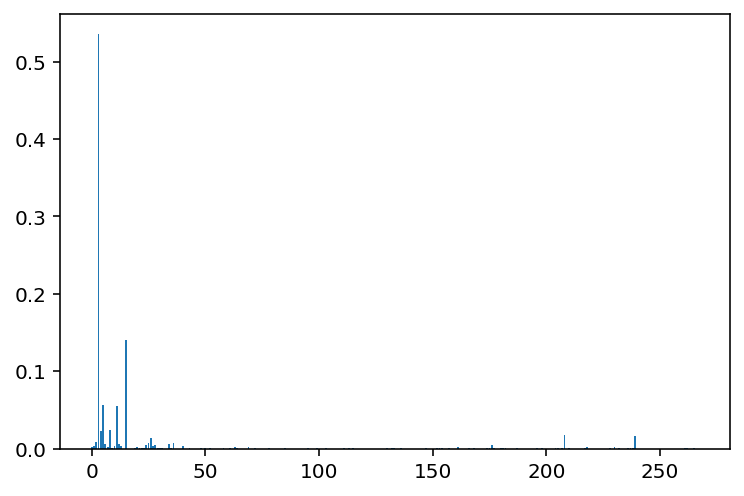

In [109]:
######CART Regression Feature Importance
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor
from matplotlib import pyplot
# define the model
model_cart = DecisionTreeRegressor()
# fit the model
model_cart.fit(scaled_train_df, scaled_train_y)
# get importance
importance = model_cart.feature_importances_
j_col=0
feature_list=[]
list_cols=scaled_train_df.columns
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v) )
    print(list_cols[j_col])
    if v>0.011:
        feature_list.append(list_cols[j_col])
    j_col+=1
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()
#print(importance, model_cart.feature_names)

In [110]:
feature_list

['OverallQual',
 'OverallCond',
 'YearBuilt',
 'BsmtFinSF1',
 'TotalBsmtSF',
 'GrLivArea',
 'GarageArea',
 'CentralAir_N',
 'GarageFinish_Unf']

In [111]:
#list best features of cart regression
#['OverallQual', 'OverallCond','YearBuilt','BsmtFinSF1','TotalBsmtSF','GrLivArea','GarageCars','GarageArea','MSZoning_C (all)','CentralAir_N','GarageFinish_Unf']

Feature: 0, Score: 0.00189
MSSubClass
Feature: 1, Score: 0.00607
LotFrontage
Feature: 2, Score: 0.01130
LotArea
Feature: 3, Score: 0.53337
OverallQual
Feature: 4, Score: 0.01216
OverallCond
Feature: 5, Score: 0.02180
YearBuilt
Feature: 6, Score: 0.00818
YearRemodAdd
Feature: 7, Score: 0.00339
MasVnrArea
Feature: 8, Score: 0.02359
BsmtFinSF1
Feature: 9, Score: 0.00052
BsmtFinSF2
Feature: 10, Score: 0.00599
BsmtUnfSF
Feature: 11, Score: 0.05584
TotalBsmtSF
Feature: 12, Score: 0.01671
1stFlrSF
Feature: 13, Score: 0.00529
2ndFlrSF
Feature: 14, Score: 0.00003
LowQualFinSF
Feature: 15, Score: 0.12609
GrLivArea
Feature: 16, Score: 0.00168
BsmtFullBath
Feature: 17, Score: 0.00023
BsmtHalfBath
Feature: 18, Score: 0.00172
FullBath
Feature: 19, Score: 0.00093
HalfBath
Feature: 20, Score: 0.00170
BedroomAbvGr
Feature: 21, Score: 0.00090
KitchenAbvGr
Feature: 22, Score: 0.00172
TotRmsAbvGrd
Feature: 23, Score: 0.00382
Fireplaces
Feature: 24, Score: 0.00382
GarageYrBlt
Feature: 25, Score: 0.02218
Ga

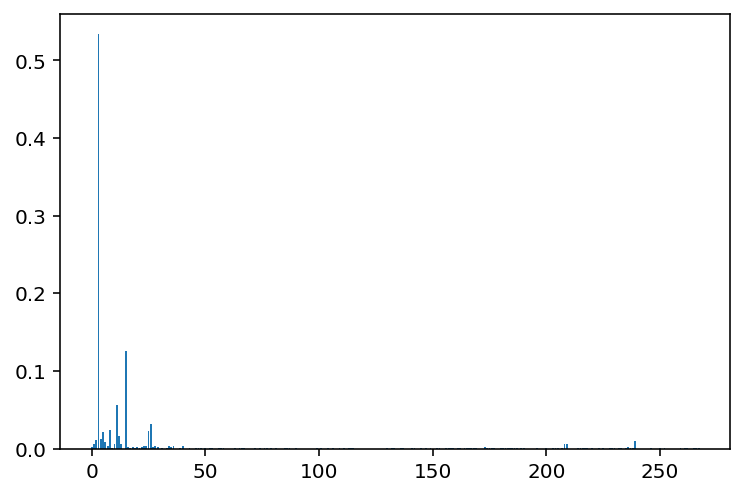

['LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'BsmtFinSF1',
 'TotalBsmtSF',
 '1stFlrSF',
 'GrLivArea',
 'GarageCars',
 'GarageArea']

In [112]:
from sklearn.datasets import make_regression
from sklearn.ensemble import RandomForestRegressor
#Cart classifier Feature Importance
model_cart2 = RandomForestRegressor()
# fit the model
model_cart2.fit(scaled_train_df, scaled_train_y)
# get importance
importance = model_cart2.feature_importances_
j_col=0
feature_list2=[]
list_cols=scaled_train_df.columns
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v) )
    print(list_cols[j_col])
    if v>0.011:
        feature_list2.append(list_cols[j_col])
    j_col+=1
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()
feature_list2



In [113]:
scaled_train_df['GarageFinish_Unf']

0       0
1       0
2       0
3       1
4       0
       ..
1454    0
1455    0
1456    1
1458    1
1459    0
Name: GarageFinish_Unf, Length: 1314, dtype: uint8

In [114]:
#List of models and their best mean score>>>>

#1st model with ['OverallQual', 'YearBuilt', 'TotalBsmtSF', 'GrLivArea','GarageArea','GarageCars'] gives 
#mean score 0.1446
#2nd model with ['OverallQual', 'YearBuilt', 'TotalBsmtSF', 'GrLivArea', 'GarageArea','GarageCars', 'YearRemodAdd', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'ExterQual_TA', 'BsmtQual_Ex','KitchenQual_Ex', 'KitchenQual_TA', 'GarageFinish_Unf' ]
#mean score: 0.13940083998889974
#3rd model with ['OverallQual', 'YearBuilt', 'TotalBsmtSF', 'GrLivArea','GarageArea','GarageCars', 'YearRemodAdd', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'GarageFinish_Unf' ]
#Stacking mean score: 0.1403345543344216
#4th model with ['OverallQual', 'OverallCond','YearBuilt','BsmtFinSF1','TotalBsmtSF','GrLivArea','GarageCars','GarageArea','MSZoning_C (all)','CentralAir_N','GarageFinish_Unf']
#Stacking mean score: 0.12266835870293939
#5th model with ['LotArea','OverallQual','OverallCond','YearBuilt','BsmtFinSF1','TotalBsmtSF','1stFlrSF','GrLivArea','GarageCars','GarageArea']
#Stacking mean score: 0.12101993991598907    Stacking mean score: 0.12166459106217516
new_working_train_df=scaled_train_df[['LotArea','OverallQual','OverallCond','YearBuilt','BsmtFinSF1','TotalBsmtSF','1stFlrSF','GrLivArea','GarageCars','GarageArea']].copy()

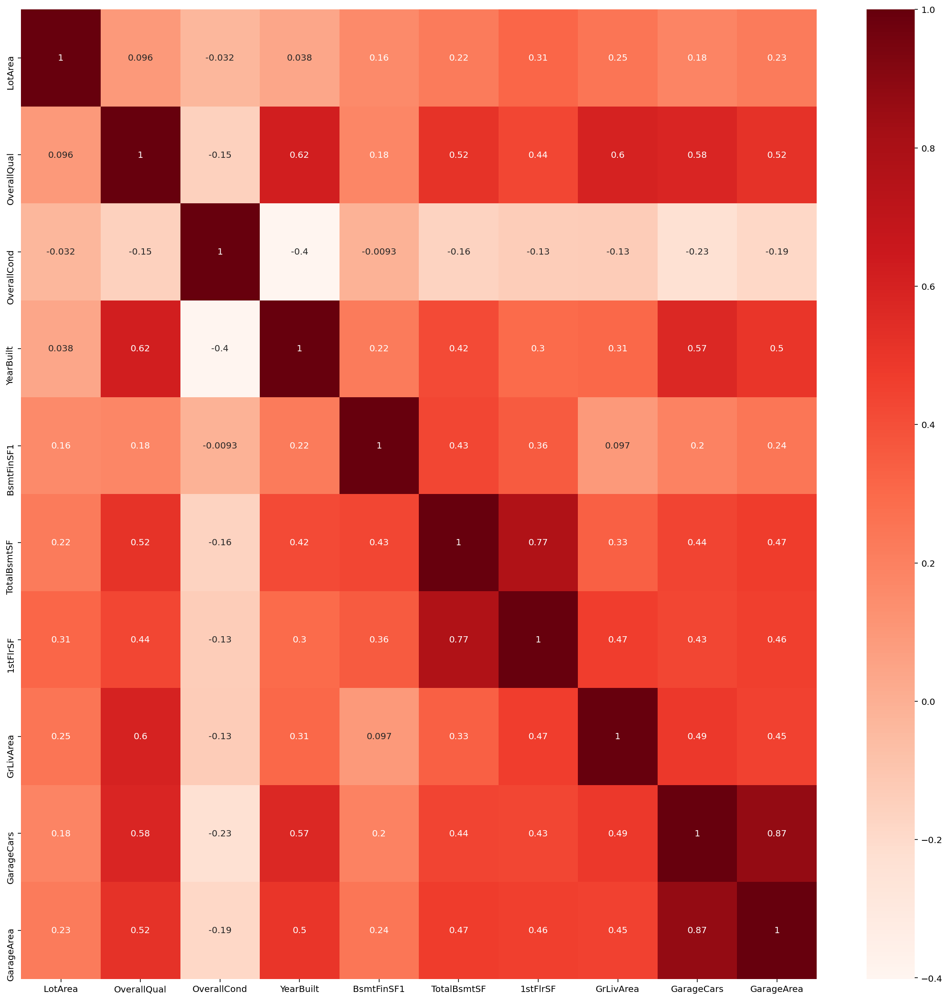

0       12.247699
1       12.109016
2       12.317171
3       11.849405
4       12.429220
          ...    
1455    12.072547
1456    12.254868
1457    12.493133
1458    11.864469
1459    11.901590
Name: SalePrice, Length: 1460, dtype: float64

In [115]:
#Using Pearson Correlation
plt.figure(figsize=(20,20))
cor = new_working_train_df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()
#Correlation with output variable
cor_target = abs(train_df['SalePrice'])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.5]
relevant_features

In [116]:
new_working_train_df

,LotArea,OverallQual,OverallCond,YearBuilt,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,GarageCars,GarageArea
0,-0.207142,0.651479,-0.517200,1.050994,0.575425,-0.459303,-0.793434,0.370333,0.311725,0.351000
1,-0.091886,-0.071836,2.179628,0.156734,1.171992,0.466465,0.257140,-0.482512,0.311725,-0.060731
2,0.073480,0.651479,-0.517200,0.984752,0.092907,-0.313369,-0.627826,0.515013,0.311725,0.631726
3,-0.096897,0.651479,-0.517200,-1.863632,-0.499274,-0.687324,-0.521734,0.383659,1.650307,0.790804
4,0.375148,1.374795,-0.517200,0.951632,0.463568,0.199680,-0.045611,1.299326,1.650307,1.698485
...,...,...,...,...,...,...,...,...,...,...
1454,-0.302353,0.651479,-0.517200,1.084115,-0.073781,0.372976,0.151048,-0.560562,0.311725,-0.341457
1455,-0.260560,-0.071836,-0.517200,0.918511,-0.973018,-0.238122,-0.542435,0.250402,0.311725,-0.060731
1456,0.266407,-0.071836,0.381743,0.222975,0.759659,1.104925,2.355701,1.061367,0.311725,0.126420
1458,-0.080160,-0.795151,0.381743,-0.704406,-0.865548,0.046905,-0.218982,-0.832788,-1.026858,-1.090059


In [117]:
new_working_train_df

,LotArea,OverallQual,OverallCond,YearBuilt,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,GarageCars,GarageArea
0,-0.207142,0.651479,-0.517200,1.050994,0.575425,-0.459303,-0.793434,0.370333,0.311725,0.351000
1,-0.091886,-0.071836,2.179628,0.156734,1.171992,0.466465,0.257140,-0.482512,0.311725,-0.060731
2,0.073480,0.651479,-0.517200,0.984752,0.092907,-0.313369,-0.627826,0.515013,0.311725,0.631726
3,-0.096897,0.651479,-0.517200,-1.863632,-0.499274,-0.687324,-0.521734,0.383659,1.650307,0.790804
4,0.375148,1.374795,-0.517200,0.951632,0.463568,0.199680,-0.045611,1.299326,1.650307,1.698485
...,...,...,...,...,...,...,...,...,...,...
1454,-0.302353,0.651479,-0.517200,1.084115,-0.073781,0.372976,0.151048,-0.560562,0.311725,-0.341457
1455,-0.260560,-0.071836,-0.517200,0.918511,-0.973018,-0.238122,-0.542435,0.250402,0.311725,-0.060731
1456,0.266407,-0.071836,0.381743,0.222975,0.759659,1.104925,2.355701,1.061367,0.311725,0.126420
1458,-0.080160,-0.795151,0.381743,-0.704406,-0.865548,0.046905,-0.218982,-0.832788,-1.026858,-1.090059


In [118]:
new_working_train_df

,LotArea,OverallQual,OverallCond,YearBuilt,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,GarageCars,GarageArea
0,-0.207142,0.651479,-0.517200,1.050994,0.575425,-0.459303,-0.793434,0.370333,0.311725,0.351000
1,-0.091886,-0.071836,2.179628,0.156734,1.171992,0.466465,0.257140,-0.482512,0.311725,-0.060731
2,0.073480,0.651479,-0.517200,0.984752,0.092907,-0.313369,-0.627826,0.515013,0.311725,0.631726
3,-0.096897,0.651479,-0.517200,-1.863632,-0.499274,-0.687324,-0.521734,0.383659,1.650307,0.790804
4,0.375148,1.374795,-0.517200,0.951632,0.463568,0.199680,-0.045611,1.299326,1.650307,1.698485
...,...,...,...,...,...,...,...,...,...,...
1454,-0.302353,0.651479,-0.517200,1.084115,-0.073781,0.372976,0.151048,-0.560562,0.311725,-0.341457
1455,-0.260560,-0.071836,-0.517200,0.918511,-0.973018,-0.238122,-0.542435,0.250402,0.311725,-0.060731
1456,0.266407,-0.071836,0.381743,0.222975,0.759659,1.104925,2.355701,1.061367,0.311725,0.126420
1458,-0.080160,-0.795151,0.381743,-0.704406,-0.865548,0.046905,-0.218982,-0.832788,-1.026858,-1.090059


In [119]:
train_df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF'

Using Ensemble to get best mean score:
* -> Kernel Ridge
* -> Lasso Regression
* -> ElasticNet Regression
* -> Support Vector Machine
* -> Random Forest
* -> XGBoost
* Ensemble - Stacked Regression and GridSearch

In [120]:
from sklearn.model_selection import GridSearchCV,learning_curve, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score, mean_squared_error

from sklearn.linear_model import LassoCV,ElasticNetCV,Lasso,ElasticNet
from sklearn.kernel_ridge import KernelRidge

from mlxtend.regressor import StackingRegressor
from xgboost import XGBRegressor

In [121]:
kfold = KFold(n_splits=20, random_state= 0, shuffle = True)

In [122]:
def rmsle_cv(model):
    rmse= np.sqrt(-cross_val_score(model, new_working_train_df, scaled_train_y, scoring="neg_mean_squared_error", cv = kfold))
    return(rmse)

 **Kernel Ridge***

In [123]:
KR = KernelRidge()

KR_param_grid = {
    'alpha' : [0.33],
    'kernel' : ['polynomial'],
    'gamma':[0.01],
    'degree': [4],
    'coef0': [1.5]
}

KR_CV = GridSearchCV(KR, param_grid = KR_param_grid, cv = kfold, scoring = "neg_mean_squared_error",n_jobs = -1, verbose = 1)
KR_CV.fit(new_working_train_df, scaled_train_y)
KR_best = KR_CV.best_estimator_
print(KR_best)
# scaler, cv = 20
# * KernelRidge(alpha=1.0, coef0=0.9, degree=2, gamma=0.004, kernel='polynomial',kernel_params=None)
# ** KernelRidge(alpha=0.93, coef0=1.5, degree=3, gamma=0.001, kernel='polynomial',kernel_params=None)
# *** KernelRidge(alpha=0.93, coef0=1.5, degree=3, gamma=0.001, kernel='polynomial',kernel_params=None) - 0.12826927774601038
# *** KernelRidge(alpha=0.93, coef0=1.5, degree=4, gamma=0.001, kernel='polynomial',kernel_params=None) 0.12632279771640614
# *** KernelRidge(alpha=0.9, coef0=1.5, degree=4, gamma=0.001, kernel='polynomial',kernel_params=None)0.1262669304504797
#*** KernelRidge(alpha=0.85, coef0=1.5, degree=4, gamma=0.001, kernel='polynomial',kernel_params=None)0.12617401236589273
#*** KernelRidge(alpha=0.8, coef0=1.5, degree=4, gamma=0.001, kernel='polynomial',kernel_params=None)0.12608102692878104
#*** KernelRidge(alpha=0.6, coef0=1.5, degree=4, gamma=0.001, kernel='polynomial',kernel_params=None)0.125696
#*** KernelRidge(alpha=0.33, coef0=1.5, degree=4, gamma=0.001, kernel='polynomial',kernel_params=None)0.12501300884764469
#*** KernelRidge(alpha=0.33, coef0=1.5, degree=4, gamma=0.01, kernel='polynomial',kernel_params=None)0.12075211000001715

Fitting 20 folds for each of 1 candidates, totalling 20 fits
KernelRidge(alpha=0.33, coef0=1.5, degree=4, gamma=0.01, kernel='polynomial')


In [ ]:
#X_valid.drop('const',axis=1, inplace=True)
#scaled_train_df.drop('scores', axis=1, inplace=True)

In [124]:
scaled_train_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.073375,-0.220875,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1,-0.872563,0.460320,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,0,0,0,1,0,0,0,0,1,0
2,0.073375,-0.084636,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0,0,0,1,0,0,0,0,1,0
3,0.309859,-0.447940,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0,0,0,1,1,0,0,0,0,0
4,0.073375,0.641972,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,-0.872563,-0.357114,-0.302353,0.651479,-0.517200,1.084115,0.975575,-0.570750,-0.073781,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1455,0.073375,-0.357114,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,0,0,0,1,0,0,0,0,1,0
1456,-0.872563,0.687385,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0,0,0,1,0,0,0,0,1,0
1458,-0.872563,-0.084636,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,0,0,0,1,0,0,0,0,1,0


In [125]:
scaled_train_df.shape

(1314, 268)

In [126]:
scaled_test_df.shape

(1459, 272)

In [ ]:
scaled_test_df

In [127]:
new_working_test_df=scaled_test_df[['LotArea','OverallQual','OverallCond','YearBuilt','BsmtFinSF1','TotalBsmtSF','1stFlrSF','GrLivArea','GarageCars','GarageArea']].copy()

In [128]:
list1=new_working_train_df.columns
list2=new_working_test_df.columns

In [129]:
print(len(list1))
print(len(list2))

10
10


In [130]:
list1

Index(['LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'BsmtFinSF1',
       'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'GarageCars', 'GarageArea'],
      dtype='object')

In [131]:
list2

Index(['LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'BsmtFinSF1',
       'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'GarageCars', 'GarageArea'],
      dtype='object')

In [132]:
k=0
notinlist=[]
for i in list2:
    for j in list1:
        if i==j:
            k+=1
    if  k==0:
        print(i)
        notinlist.append(i)
    k=0

In [133]:
for i in notinlist:
    new_working_test_df.drop(i, axis=1, inplace=True)
#scaled_test_df.drop("SaleType_Con", axis=1, inplace=True)

In [134]:
y_submission_1 = np.expm1(KR_best.predict(new_working_test_df))

In [135]:
score = rmsle_cv(KR_best)
print("Kernel Ridge mean score:", score.mean())
print("Kernel Ridge std:", score.std())

Kernel Ridge mean score: 0.11991683328168812
Kernel Ridge std: 0.021502749815997244


Lasso Regression

In [136]:
lasso = LassoCV(alphas = [0.0001,0.0002, 0.0003, 0.0005,0.0006,0.0007, 0.0008,0.0009, 0.001,0.0011,0.0012,0.00121, 0.0013,0.0015, 0.002, 0.003,0.004, 0.005,0.006, 0.007, 0.009, 0.01,0.02, 0.03,0.04, 0.05,0.06, 0.07,0.08, 0.09, 0.2,0.3, 0.4,0.5, 0.6,0.7, 0.8,0.9, 1, 1.2, 1.5, 2], random_state = 1, n_jobs = -1, verbose = 1)
lasso.fit(new_working_train_df, scaled_train_y)
alpha = lasso.alpha_
print("Optimized Alpha:", alpha)

lasso = LassoCV(alphas = alpha * np.linspace(0.5,1.5,20), cv = kfold, random_state = 1, n_jobs = -1)
lasso.fit(new_working_train_df, scaled_train_y)
alpha = lasso.alpha_
print("Final Alpha:", alpha)
# scaler cv = 20
#lasso = LassoCV(alphas = 0.00244736842105, cv = kfold, random_state = 1, n_jobs = -1, verbose = 1)
#lasso.fit(X_train, y_df)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
..................................................................................................................................................................................................................[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished


Optimized Alpha: 0.001
Final Alpha: 0.0009210526315789473


In [137]:
print("Lasso mean score:", rmsle_cv(lasso).mean())
print("Lasso std:", rmsle_cv(lasso).std())

Lasso mean score: 0.12456540695649258
Lasso std: 0.02406471803392245


In [138]:
y_submission_2 = np.expm1(lasso.predict(new_working_test_df))

ElasticNet Regression

In [139]:
elnet = ElasticNetCV(alphas = [0.0001, 0.0003, 0.0005, 0.0008,0.0009, 0.001, 0.003, 0.007, 0.009, 0.01, 0.03, 0.05, 0.07, 0.09, 0.2, 0.4, 0.6, 0.8, 1, 1.2] 
                ,l1_ratio = [0.1, 0.3, 0.5, 0.7, 0.9,0.95, 1]
                ,cv = kfold, random_state = 1, n_jobs = -1)
elnet.fit(new_working_train_df, scaled_train_y)
alpha = elnet.alpha_
ratio = elnet.l1_ratio_
print("Optimized Alpha:", alpha)
print("Optimized l1_ratio:", ratio)

elnet = ElasticNetCV(alphas = alpha * np.linspace(0.5,1.5,20), l1_ratio = ratio * np.linspace(0.7,0.3,1), 
                     cv = kfold, random_state = 1, n_jobs = -1)
elnet.fit(new_working_train_df, scaled_train_y)

alpha = elnet.alpha_
ratio = elnet.l1_ratio_

print("Final Alpha:", alpha)
print("Final l1_ratio:", ratio)
# scaler cv = 20
# Final Alpha: 0.0276315789474, Final l1_ratio: 0.09

Optimized Alpha: 0.001
Optimized l1_ratio: 0.95
Final Alpha: 0.0013421052631578947
Final l1_ratio: 0.6649999999999999


In [140]:
print("ElasticNet mean score:", rmsle_cv(elnet).mean())
print("ElasticNet std:", rmsle_cv(elnet).std())

ElasticNet mean score: 0.12456978061449522
ElasticNet std: 0.02403970715173611


In [141]:
y_submission_3 = np.expm1(elnet.predict(new_working_test_df))

Support Vector Machine

In [142]:
epsilons = [0.093]
degrees = [2]
coef0s = [1.8]

gammas = ['auto']
Cs = [0.1]
kernels = ['poly']

param_grid = dict(C=Cs, epsilon = epsilons, gamma=gammas, kernel=kernels, degree= degrees, coef0=coef0s)
SVMR = GridSearchCV(SVR(), param_grid = param_grid, cv = kfold, scoring = "neg_mean_squared_error",n_jobs = -1,verbose = 1)

SVMR.fit(new_working_train_df, scaled_train_y)
SVMR_best = SVMR.best_estimator_
print(SVMR.best_params_)
# cv = 20 

# * {'kernel': 'poly', 'C': 0.1, 'gamma': 'auto', 'degree': 2, 'epsilon': 0.03, 'coef0': 1.5} 
# ** {'kernel': 'poly', 'C': 0.1, 'gamma': 'auto', 'degree': 2, 'epsilon': 0.03, 'coef0': 1.6} - 0.123454
# ** {'kernel': 'poly', 'C': 0.1, 'gamma': 'auto', 'degree': 2, 'epsilon': 0.05, 'coef0': 1.6} 0.1225397
# ** {'kernel': 'poly', 'C': 0.1, 'gamma': 'auto', 'degree': 2, 'epsilon': 0.07, 'coef0': 1.6}0.122064
# ** {'kernel': 'poly', 'C': 0.1, 'gamma': 'auto', 'degree': 2, 'epsilon': 0.093, 'coef0': 1.8}0.1216531

Fitting 20 folds for each of 1 candidates, totalling 20 fits
{'C': 0.1, 'coef0': 1.8, 'degree': 2, 'epsilon': 0.093, 'gamma': 'auto', 'kernel': 'poly'}


In [143]:
print("SVM mean score:", rmsle_cv(SVMR_best).mean())
print("SVM std:", rmsle_cv(SVMR_best).std())

SVM mean score: 0.12073779475701038
SVM std: 0.023099616449857516


In [144]:
y_submission_4 = np.expm1(SVMR.predict(new_working_test_df))

Random Forest

In [145]:
RFC = RandomForestRegressor(random_state = 1)

rf_param_grid = {"max_depth": [None],
              "max_features": [6],
              "min_samples_leaf": [1],
              "n_estimators" :[580]
                }

gsRFC = GridSearchCV(RFC,param_grid = rf_param_grid, cv = kfold, scoring = "neg_mean_squared_error", n_jobs = -1, verbose = 1)
gsRFC.fit(new_working_train_df, scaled_train_y)
RFC_best = gsRFC.best_estimator_
print(gsRFC.best_params_)

# cv = 20 (Scaler)

# {'max_depth': None, 'min_samples_leaf': 1, 'max_features': 10, 'n_estimators': 570} - 0.135154
# {'max_depth': None, 'min_samples_leaf': 1, 'max_features': 10, 'n_estimators': 580} 0.135125
# {'max_depth': None, 'min_samples_leaf': 1, 'max_features': 6, 'n_estimators': 580} 0.1320166

Fitting 20 folds for each of 1 candidates, totalling 20 fits
{'max_depth': None, 'max_features': 6, 'min_samples_leaf': 1, 'n_estimators': 580}


In [146]:
print("Random Forest mean score:", rmsle_cv(RFC_best).mean())
print("Random Forest std:", rmsle_cv(RFC_best).std())

Random Forest mean score: 0.12938905016879296
Random Forest std: 0.026038048873311397


In [147]:
y_submission_5 = np.expm1(gsRFC.predict(new_working_test_df))

XG Boost

In [148]:
new_scaled_train_df=pd.DataFrame(new_working_train_df)

In [149]:
#X_train into numpy.ndarray
new_scaled_train_df=new_scaled_train_df.values

In [150]:
new_scaled_train_df

array([[-0.20714171,  0.65147924, -0.51719981, ...,  0.37033344,
         0.31172464,  0.35100032],
       [-0.09188637, -0.07183611,  2.17962776, ..., -0.48251191,
         0.31172464, -0.06073101],
       [ 0.07347998,  0.65147924, -0.51719981, ...,  0.51501256,
         0.31172464,  0.63172623],
       ...,
       [ 0.26640739, -0.07183611,  0.38174271, ...,  1.06136662,
         0.31172464,  0.12641959],
       [-0.08016039, -0.79515147,  0.38174271, ..., -0.83278768,
        -1.02685765, -1.09005935],
       [-0.05811155, -0.79515147,  0.38174271, ..., -0.49393395,
        -1.02685765, -0.9216238 ]])

In [151]:
XGB = XGBRegressor()

xg_param_grid = {
              'n_estimators' :[870],
              'learning_rate': [0.04],
              
              'max_depth': [3],
              'min_child_weight':[0.2],
              
              'gamma': [0],
                
              'subsample':[0.8],
              'colsample_bytree':[0.7]
    
              #'reg_alpha':[0.08,0.09,0.095,0.1,0.15,0.2],
              #'reg_lambda':[0,0.001,0.002]
              }
                
gsXGB = GridSearchCV(XGB,param_grid = xg_param_grid, cv=kfold, scoring="neg_mean_squared_error", n_jobs= -1, verbose = 1)
gsXGB.fit(new_scaled_train_df, scaled_train_y)
XGB_best = gsXGB.best_estimator_
print(gsXGB.best_params_)

# cv = 20
# {'min_child_weight': 0.5, 'learning_rate': 0.05, 'n_estimators': 850, 'max_depth': 3} - 0.12611
# {'min_child_weight': 0.2, 'learning_rate': 0.04, 'gamma': 0, 'n_estimators': 870, 'max_depth': 3}
# * {'max_depth': 3, 'subsample': 0.8, 'learning_rate': 0.04, 'gamma': 0, 'colsample_bytree': 0.7, 'min_child_weight': 0.2, 'n_estimators': 870} - 0.12287
# {'gamma': 0, 'min_child_weight': 0.1, 'learning_rate': 0.04, 'n_estimators': 885, 'max_depth': 3}

# {'reg_alpha': 0.1, 'reg_lambda': 0.001, 'n_estimators': 870, 'colsample_bytree': 0.7, 'subsample': 0.8, 'min_child_weight': 0.2, 'learning_rate': 0.04, 'gamma': 0, 'max_depth': 3} - 0.12531
# 

Fitting 20 folds for each of 1 candidates, totalling 20 fits
{'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.04, 'max_depth': 3, 'min_child_weight': 0.2, 'n_estimators': 870, 'subsample': 0.8}


In [152]:
new_scaled_test_df=pd.DataFrame(new_working_test_df)
new_scaled_test_df=new_scaled_test_df.values

In [ ]:
#new_scaled_test_df

In [153]:
print("XG Boost mean score:", rmsle_cv(XGB_best).mean())
print("XG Boost std:", rmsle_cv(XGB_best).std())

XG Boost mean score: 0.12333409762163668
XG Boost std: 0.0215441932224083


In [154]:
y_submission_6 = np.expm1(gsXGB.predict(new_scaled_test_df))

Ensemble - Stacked Regression and GridSearch

In [155]:
XGB = XGBRegressor()

ELNET = ElasticNet(random_state = 1)
LCV=Lasso(random_state = 1)
SV = SVR()
KR = KernelRidge()
XG = XGBRegressor()
stack = StackingRegressor(regressors = [ELNET,LCV,XG],meta_regressor = XGB)
                          #(
    #n_estimators=1480,
#learning_rate= 0.01/2, #0.01
# min_child_weight=0,
 #             gamma=0.1,
  #            max_depth= 2,
  #            subsample=0.65,
   #           colsample_bytree=0.4,
   #           reg_alpha=0,
    #          reg_lambda=1,    
     #                                                                     ))

params = {       
             'meta_regressor__n_estimators': [740*2],#740
             'meta_regressor__learning_rate': [0.01/2], #0.01
             'meta_regressor__min_child_weight':[0],
             'meta_regressor__gamma':[0.1],
             'meta_regressor__max_depth': [2],
             'meta_regressor__subsample':[0.65],
             'meta_regressor__colsample_bytree':[0.4],
             'meta_regressor__reg_alpha':[0],
             'meta_regressor__reg_lambda':[1],
              
              'lasso__alpha':[0.00244736842105],
              'elasticnet__alpha':[0.0276315789474],
              'elasticnet__l1_ratio':[0.09],
              'xgbregressor__min_child_weight':[0.2],
              'xgbregressor__n_estimators' : [870],
              'xgbregressor__learning_rate': [0.04],
              'xgbregressor__gamma':[0],
              'xgbregressor__max_depth': [3],
              'xgbregressor__subsample':[0.8],
              'xgbregressor__colsample_bytree':[0.7]
    
              #'kernelridge__alpha':[0.93],
              #'kernelridge__coef0':[1.5],
              #'kernelridge__degree':[3],
              #'kernelridge__gamma':[0.001],
              #'kernelridge__kernel':['polynomial'],
              #'kernelridge__kernel_params':[None],
              
              #'svr__coef0':[1.6],
              #'svr__kernel':['poly'],
              #'svr__epsilon':[0.03],
              #'svr__gamma': ['auto'],
              #'svr__degree': [2],
              #'svr__C':[0.1]
        }

grid = GridSearchCV(estimator = stack, param_grid=params,cv=kfold,refit=True, verbose=1,n_jobs=1,scoring="neg_mean_squared_error")
grid.fit(new_scaled_train_df, scaled_train_y)
grid_best = grid.best_estimator_
print(grid_best)

#StackingRegressor(meta_regressor=XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=1, gamma=0,
#learning_rate=0.01, max_delta_step=0, max_depth=3,
#min_child_weight=0.5, missing=None, n_estimators=770, nthread=-1,
#objective='reg:linear', reg_alpha=0, reg_lambda=1,
#scale_pos_weight=1, seed=0, silent=True, subsample=1) - 0.12965

# StackingRegressor(meta_regressor=XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.5,
# gamma=0, learning_rate=0.02, max_delta_step=0, max_depth=1,
# min_child_weight=0.3, missing=None, n_estimators=760, nthread=-1,
# objective='reg:linear', reg_alpha=0, reg_lambda=1,
# scale_pos_weight=1, seed=0, silent=True, subsample=0.3) - 0.12546

#StackingRegressor(meta_regressor=XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.5,
#gamma=0, learning_rate=0.02, max_delta_step=0, max_depth=1,
#min_child_weight=0.2, missing=None, n_estimators=760, nthread=-1,
#objective='reg:linear', reg_alpha=0, reg_lambda=1,
#scale_pos_weight=1, seed=0, silent=True, subsample=0.2) - 0.12493

#StackingRegressor(meta_regressor=XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.4,
#gamma=0.1, learning_rate=0.01, max_delta_step=0, max_depth=2,
#min_child_weight=0, missing=None, n_estimators=740, nthread=-1,
#objective='reg:linear', reg_alpha=0, reg_lambda=1,
#scale_pos_weight=1, seed=0, silent=True, subsample=0.65) - 0.12027

#StackingRegressor(meta_regressor=XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=0.4,
#gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=2,
#min_child_weight=0, missing=None, n_estimators=1480, nthread=-1,
#objective='reg:linear', reg_alpha=0, reg_lambda=1,
#scale_pos_weight=1, seed=0, silent=True, subsample=0.65) - 0.12026

Fitting 20 folds for each of 1 candidates, totalling 20 fits
StackingRegressor(meta_regressor=XGBRegressor(base_score=None, booster=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=0.4, gamma=0.1,
                                              gpu_id=None,
                                              importance_type='gain',
                                              interaction_constraints=None,
                                              learning_rate=0.005,
                                              max_delta_step=None, max_depth=2,
                                              min_child_weight=0, missing=nan,
                                              monotone_constraints=None,
                                              n_estimators=1480, n_jobs=N...
                                           gpu_id=None, importa

In [156]:
print("Stacking mean score:", rmsle_cv(grid_best).mean())
print("Stacking std:", rmsle_cv(grid_best).std())

Stacking mean score: 0.121281594339998
Stacking std: 0.021882394823918832


In [157]:
y_submission_st = np.expm1(grid.predict(new_scaled_test_df))

In [158]:
y_submission_st

array([129368.96, 168443.06, 174632.72, ..., 181604.75, 118864.98,
       236326.62], dtype=float32)

In [160]:
#Lasso Regression + XGBoost + Ensemble
#y_submission_avg = (y_submission_2 + y_submission_6 + y_submission_st)/3..........public score: 0.14868
#y_submission_avg=y_submission_6...................................................public score: 0.15407
#y_submission_avg=y_submission_1...................................................public score: 0.15947
#y_submission_avg=y_submission_2...................................................public score: 0.15999
#y_submission_avg=y_submission_st..................................................public score: 0.14052
y_submission_avg=y_submission_st

In [161]:
scaled_test_df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Exterior1st_Stone,RoofMatl_Membran,Electrical_Mix,Heating_OthW,Condition2_RRNn,Exterior2nd_Other,Heating_Floor,RoofMatl_Roll,Exterior1st_ImStucc,Condition2_RRAn
0,-0.874711,0.567330,0.363929,-0.751101,0.400766,-0.340945,-1.072885,-0.563316,0.063428,0.517537,...,0,0,0,0,0,0,0,0,0,0
1,-0.874711,0.615963,0.897861,-0.054877,0.400766,-0.439695,-1.214908,0.047057,1.063511,-0.297689,...,0,0,0,0,0,0,0,0,0,0
2,0.061351,0.275532,0.809646,-0.751101,-0.497418,0.844059,0.678742,-0.563316,0.773377,-0.297689,...,0,0,0,0,0,0,0,0,0,0
3,0.061351,0.470064,0.032064,-0.054877,0.400766,0.876976,0.678742,-0.450284,0.357958,-0.297689,...,0,0,0,0,0,0,0,0,0,0
4,1.465443,-1.232092,-0.971808,1.337571,-0.497418,0.679475,0.394694,-0.563316,-0.387160,-0.297689,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2.401505,-2.302019,-1.591330,-1.447325,1.298950,-0.044694,-0.646813,-0.563316,-0.965230,-0.297689,...,0,0,0,0,0,0,0,0,0,0
1455,2.401505,-2.302019,-1.599808,-1.447325,-0.497418,-0.044694,-0.646813,-0.563316,-0.411338,-0.297689,...,0,0,0,0,0,0,0,0,0,0
1456,-0.874711,4.457971,2.055150,-0.751101,1.298950,-0.373861,0.584059,-0.563316,1.725105,-0.297689,...,0,0,0,0,0,0,0,0,0,0
1457,0.646389,-0.308065,0.125527,-0.751101,-0.497418,0.679475,0.394694,-0.563316,-0.224509,-0.297689,...,0,0,0,0,0,0,0,0,0,0


In [162]:

new_working_test_df = (new_working_test_df.reset_index()
      .rename(columns= {'index':'Id'}))

In [163]:
new_working_test_df

,Id,LotArea,OverallQual,OverallCond,YearBuilt,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,GarageCars,GarageArea
0,0,0.363929,-0.751101,0.400766,-0.340945,0.063428,-0.370716,-0.654561,-1.215588,-0.988189,1.185921
1,1,0.897861,-0.054877,0.400766,-0.439695,1.063511,0.639230,0.433298,-0.323539,-0.988189,-0.741235
2,2,0.809646,-0.751101,-0.497418,0.844059,0.773377,-0.266784,-0.574165,0.294508,0.301406,0.042537
3,3,0.032064,-0.054877,0.400766,0.876976,0.357958,-0.271303,-0.579190,0.243004,0.301406,-0.012788
4,4,-0.971808,1.337571,-0.497418,0.679475,-0.387160,0.528520,0.310192,-0.424487,0.301406,0.153187
...,...,...,...,...,...,...,...,...,...,...,...
1454,1454,-1.591330,-1.447325,1.298950,-0.044694,-0.965230,-1.129871,-1.533893,-0.811797,-2.277784,-2.179687
1455,1455,-1.599808,-1.447325,-0.497418,-0.044694,-0.411338,-1.129871,-1.533893,-0.811797,-0.988189,-0.861106
1456,1456,2.055150,-0.751101,1.298950,-0.373861,1.725105,0.401995,0.169499,-0.539856,0.301406,0.475916
1457,1457,0.125527,-0.751101,-0.497418,0.679475,-0.224509,-0.302935,-0.468645,-1.063136,-2.277784,-2.179687


In [164]:

my_submission = pd.DataFrame()
my_submission['Id'] = y_id
my_submission['SalePrice'] = y_submission_avg
my_submission.to_csv('submission_House_predict.csv',index=False)

In [165]:
pd.set_option('display.max_rows', 500)
pd.set_option("display.max_columns", 100)

**CART Regression Feature Importance**

In [ ]:
######CART Regression Feature Importance
#from sklearn.datasets import make_regression
#from sklearn.tree import DecisionTreeRegressor
#from matplotlib import pyplot
#X=train_df.drop("SalePrice",1)
#y=train_df["SalePrice"]
# define the model
#model1 = DecisionTreeRegressor()
# fit the model
#model1.fit(X, y)
# get importance
#importance = model1.feature_importances_
# summarize feature importance
#for i,v in enumerate(importance):
#	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
#pyplot.bar([x for x in range(len(importance))], importance)
#pyplot.show()

In [ ]:
#rr=list(train_df.columns)
#len(rr)